<a href="https://colab.research.google.com/github/sathishbandaru/6671/blob/master/Copy_of_Chest_x_ray_final_projectt.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
organizations_nih_chest_xrays_data_path = kagglehub.dataset_download('organizations/nih-chest-xrays/data')

print('Data source import complete.')


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

#import os
#for dirname, _, filenames in os.walk('/kaggle/input'):
 #   for filename in filenames:
  #      print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from itertools import combinations
from matplotlib.ticker import MaxNLocator
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
from keras.preprocessing.image import load_img, img_to_array

In [ ]:
#path for Kaggle dataset
csv_file_path = '/kaggle/input/data/Data_Entry_2017.csv'
data = pd.read_csv(csv_file_path)

## Display basic information about the dataset
print("Dataset Information:")
data.info()
print("\nPreview of Dataset:")
print(data.head())

Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112120 entries, 0 to 112119
Data columns (total 12 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Image Index                  112120 non-null  object 
 1   Finding Labels               112120 non-null  object 
 2   Follow-up #                  112120 non-null  int64  
 3   Patient ID                   112120 non-null  int64  
 4   Patient Age                  112120 non-null  int64  
 5   Patient Gender               112120 non-null  object 
 6   View Position                112120 non-null  object 
 7   OriginalImage[Width          112120 non-null  int64  
 8   Height]                      112120 non-null  int64  
 9   OriginalImagePixelSpacing[x  112120 non-null  float64
 10  y]                           112120 non-null  float64
 11  Unnamed: 11                  0 non-null       float64
dtypes: float64(3), int64(5), object(4)
me

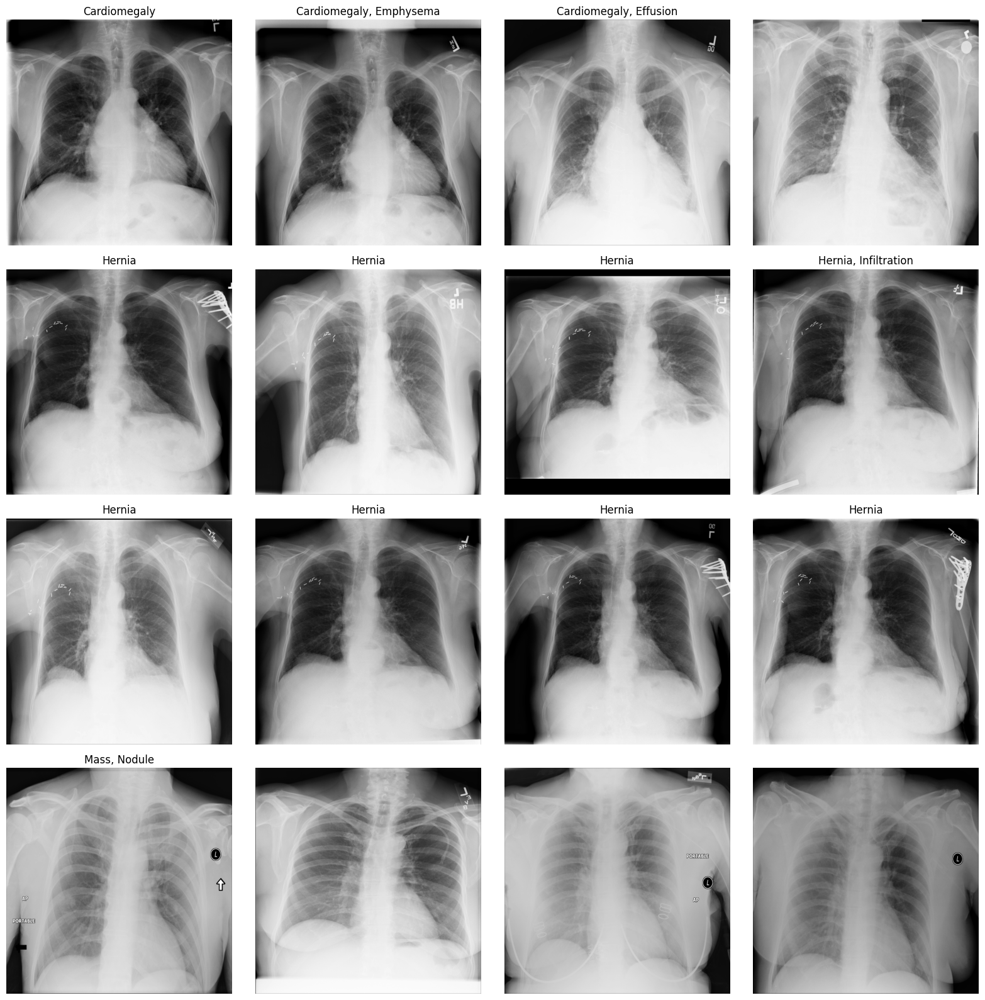

In [ ]:
all_labels = ['Cardiomegaly', 'Emphysema', 'Effusion', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'Pneumonia', 'Pneumothorax', 'Atelectasis', 'Fibrosis', 'Edema', 'Consolidation', 'Pleural_Thickening']
image_paths = data['Image Index'].head(16)  # Load the first 16 image paths
labels = data['Finding Labels'].head(16).apply(lambda x: x.split('|'))  # Example multi-label format
sample_size = 16
fig, m_axs = plt.subplots(4, 4, figsize=(16, 16))
for i, (img_path, label_str, c_ax) in enumerate(zip(image_paths, labels, m_axs.flatten())):
    img = load_img(f'/kaggle/input/data/images_001/images/{img_path}', target_size=(1024, 1024))
    img_array = img_to_array(img) / 255.0  # Normalize image

    if img_array.ndim == 3:
        img_array = np.dot(img_array[...,:3], [0.2989, 0.5870, 0.1140])
    label_list = [label for label in all_labels if label in label_str]
    c_ax.imshow(img_array, cmap='gray', vmin=0, vmax=1)
    c_ax.set_title(', '.join(label_list))
    c_ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
print("\nMissing Values in Dataset:")
print(data.isnull().sum())


Missing Values in Dataset:
Image Index                         0
Finding Labels                      0
Follow-up #                         0
Patient ID                          0
Patient Age                         0
Patient Gender                      0
View Position                       0
OriginalImage[Width                 0
Height]                             0
OriginalImagePixelSpacing[x         0
y]                                  0
Unnamed: 11                    112120
dtype: int64


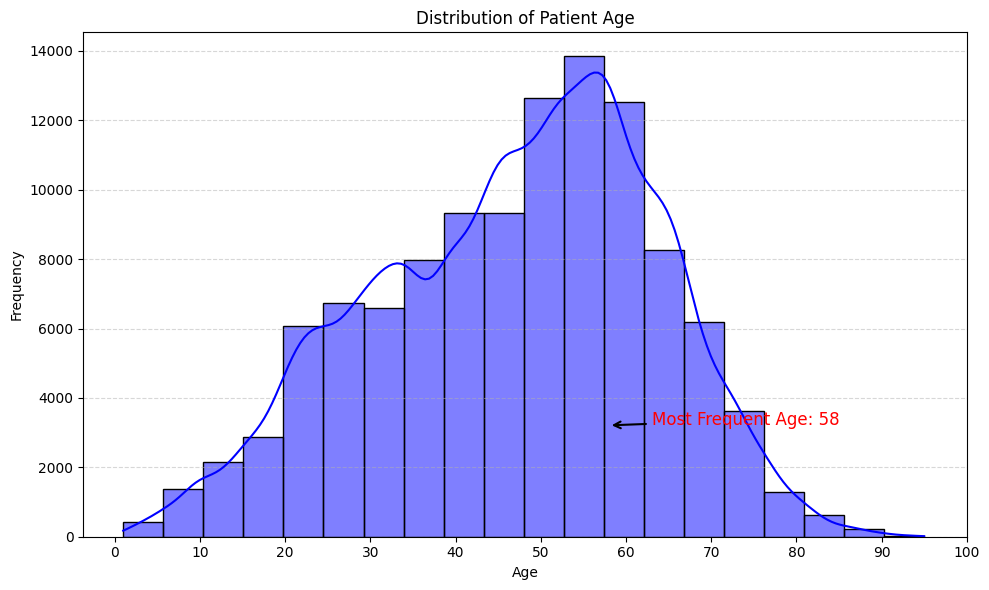

In [ ]:
data['Patient Age'] = data['Patient Age'].replace([float('inf'), -float('inf')], pd.NA)
age_filtered = data[data['Patient Age'] <= 100]
plt.figure(figsize=(10, 6))
sns.histplot(age_filtered['Patient Age'], kde=True, bins=20, color='blue')
mode_age = age_filtered['Patient Age'].mode()[0]
plt.annotate(f'Most Frequent Age: {mode_age}', xy=(mode_age, age_filtered['Patient Age'].value_counts().max()),
             xytext=(mode_age + 5, age_filtered['Patient Age'].value_counts().max() + 5),
             arrowprops=dict(arrowstyle="->", lw=1.5),
             fontsize=12, color='red')
plt.xticks(range(0, 101, 10))  # Set ticks in increments of 5
plt.title('Distribution of Patient Age')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

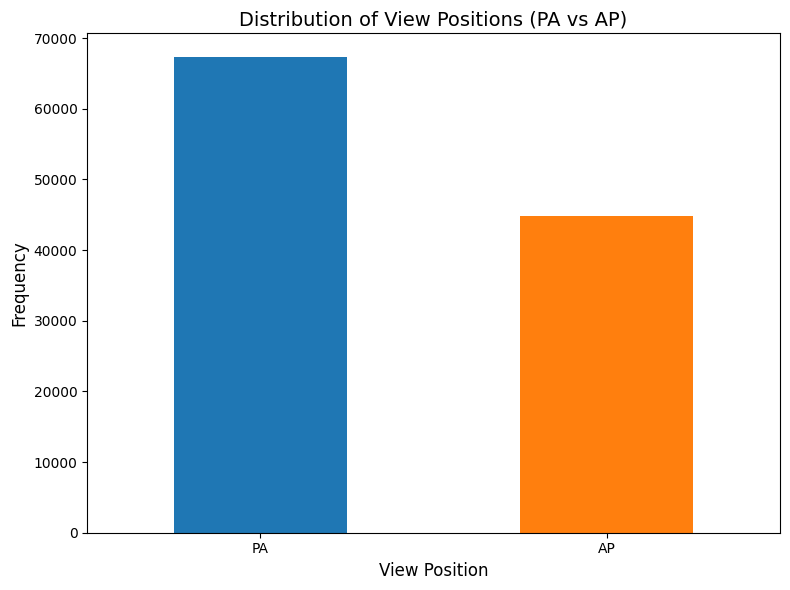

In [ ]:
view_position_counts = data['View Position'].value_counts()
plt.figure(figsize=(8, 6))
view_position_counts.plot(kind='bar', color=['#1f77b4', '#ff7f0e'])
plt.title('Distribution of View Positions (PA vs AP)', fontsize=14)
plt.xlabel('View Position', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

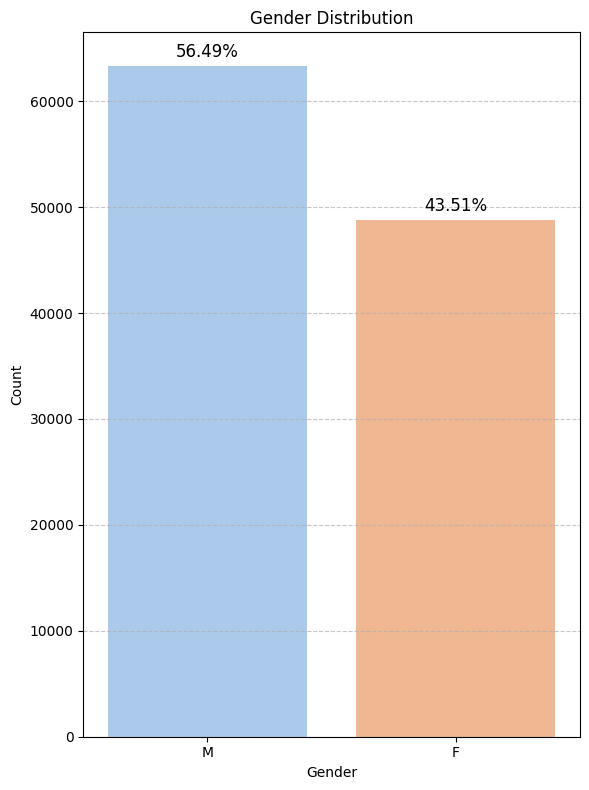

In [ ]:
plt.figure(figsize=(6, 8))
ax = sns.countplot(x='Patient Gender', data=data, palette='pastel')
plt.title('Gender Distribution')
plt.xlabel('Gender')
plt.ylabel('Count')

total = len(data)
for p in ax.patches:
    height = p.get_height()
    percentage = (height / total) * 100
    ax.annotate(f'{percentage:.2f}%',
                (p.get_x() + p.get_width() / 2., height),
                ha='center', va='center',
                fontsize=12, color='black',
                xytext=(0, 10), textcoords='offset points')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

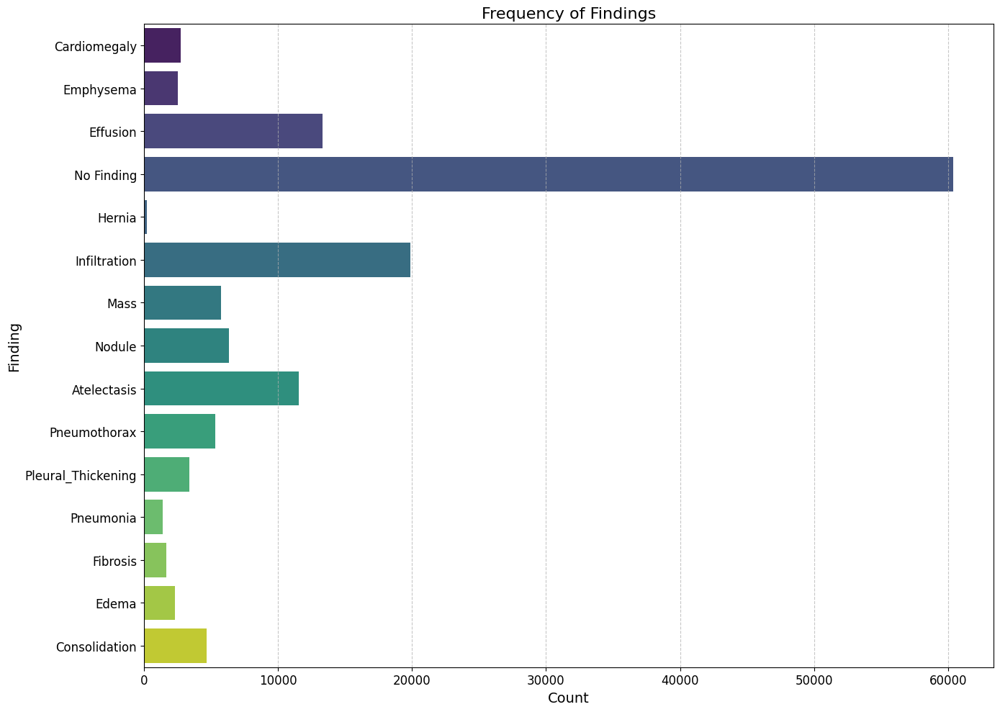

In [ ]:
def split_labels(labels):
    return labels.split('|')

all_findings = data['Finding Labels'].apply(split_labels).sum()

finding_counts = Counter(all_findings)

plt.figure(figsize=(14, 10))
sns.barplot(x=list(finding_counts.values()), y=list(finding_counts.keys()), palette='viridis')
plt.title('Frequency of Findings', fontsize=16)
plt.xlabel('Count', fontsize=14)
plt.ylabel('Finding', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

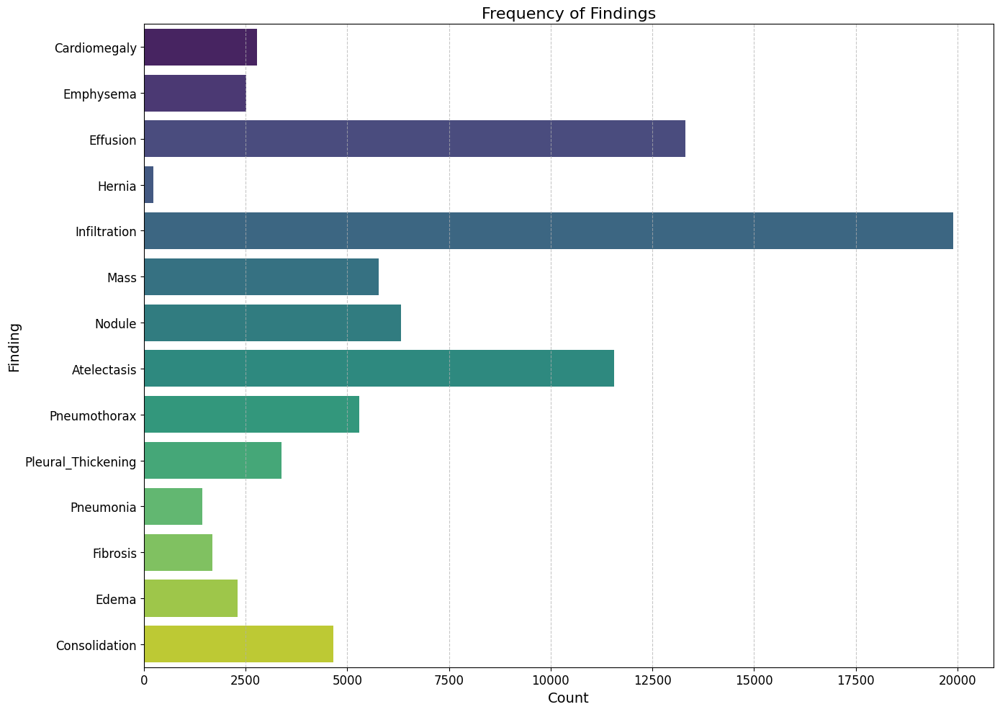

In [ ]:
def split_labels(labels):
    return labels.split('|')

all_findings = data['Finding Labels'].apply(split_labels).sum()

# Remove 'No Finding' from the findings
filtered_findings = [finding for finding in all_findings if finding != 'No Finding']

finding_counts = Counter(filtered_findings)

plt.figure(figsize=(14, 10))
sns.barplot(x=list(finding_counts.values()), y=list(finding_counts.keys()), palette='viridis')
plt.title('Frequency of Findings', fontsize=16)
plt.xlabel('Count', fontsize=14)
plt.ylabel('Finding', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

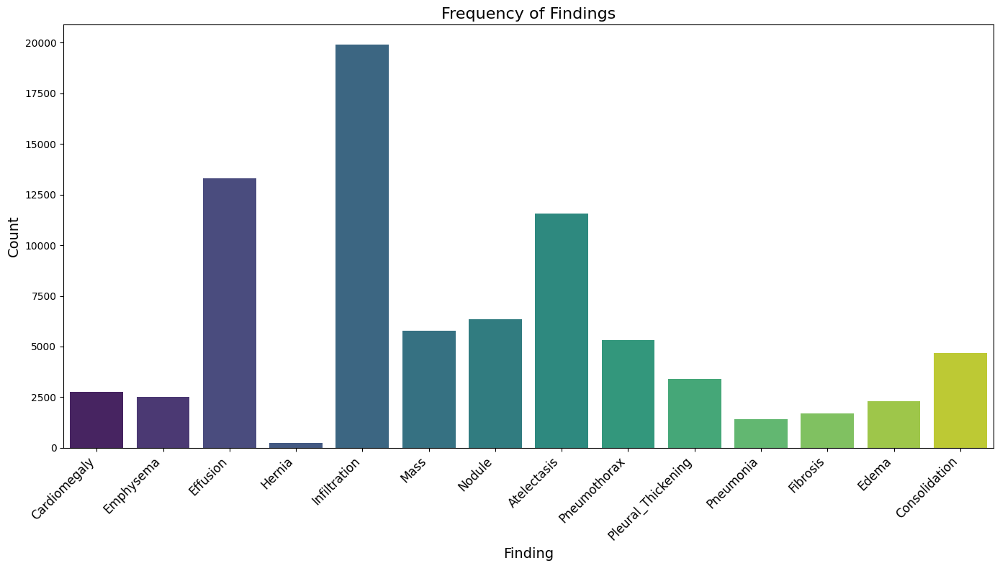

In [ ]:
expanded_data = data.copy()
expanded_data['Finding Labels'] = expanded_data['Finding Labels'].apply(split_labels)
expanded_data = expanded_data.explode('Finding Labels')

# Remove 'No Finding' category from the dataset and ages greater than 100
expanded_data = expanded_data[(expanded_data['Finding Labels'] != 'No Finding') & (expanded_data['Patient Age'] <= 100)]
plt.figure(figsize=(14, 8))
sns.countplot(x='Finding Labels', data=expanded_data, palette='viridis')
plt.title('Frequency of Findings', fontsize=16)
plt.xlabel('Finding', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45, fontsize=12, ha='right')
plt.tight_layout()
plt.show()

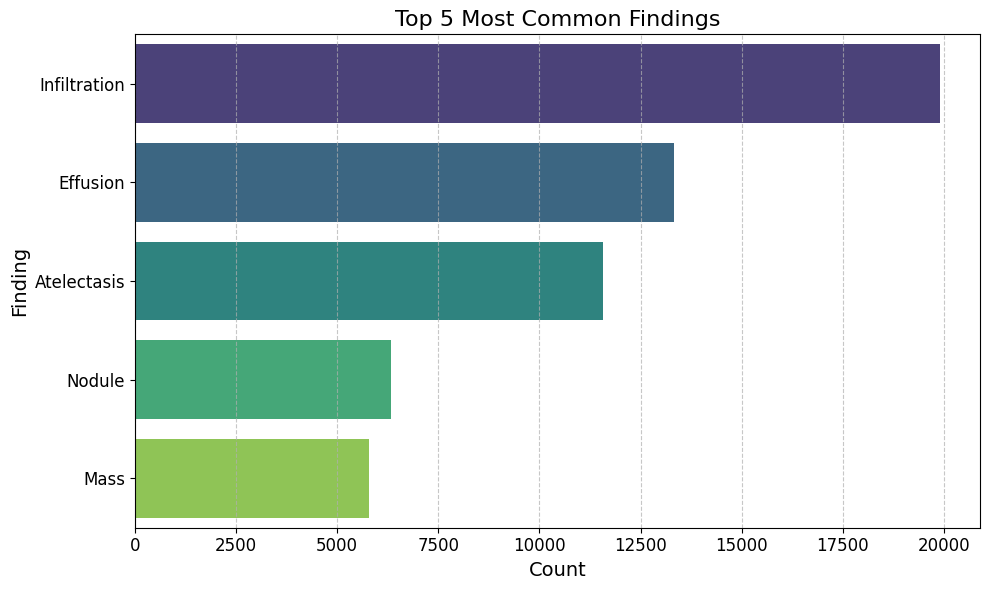

In [ ]:
expanded_data = data.copy()
expanded_data['Finding Labels'] = expanded_data['Finding Labels'].apply(lambda x: x.split('|'))
expanded_data = expanded_data.explode('Finding Labels')
expanded_data = expanded_data[expanded_data['Finding Labels'] != 'No Finding']
finding_counts = Counter(expanded_data['Finding Labels'])

top_findings = finding_counts.most_common(5)
top_findings_labels, top_findings_counts = zip(*top_findings)

plt.figure(figsize=(10, 6))
sns.barplot(x=list(top_findings_counts), y=list(top_findings_labels), palette='viridis')
plt.title('Top 5 Most Common Findings', fontsize=16)
plt.xlabel('Count', fontsize=14)
plt.ylabel('Finding', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

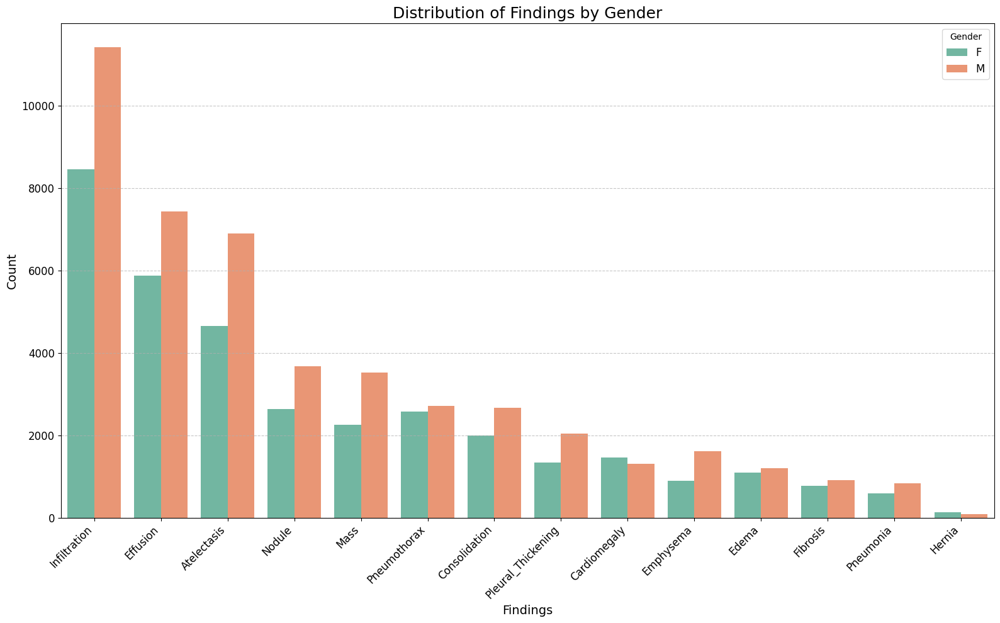

In [ ]:
expanded_data = data.copy()
expanded_data['Finding Labels'] = expanded_data['Finding Labels'].apply(lambda x: x.split('|'))
expanded_data = expanded_data.explode('Finding Labels')
expanded_data = expanded_data[expanded_data['Finding Labels'] != 'No Finding']
gender_finding_counts = expanded_data.groupby(['Finding Labels', 'Patient Gender']).size().reset_index(name='Count')
total_counts = gender_finding_counts.groupby('Finding Labels')['Count'].sum().sort_values(ascending=False)
gender_finding_counts['Finding Labels'] = pd.Categorical(
    gender_finding_counts['Finding Labels'], categories=total_counts.index, ordered=True
)
plt.figure(figsize=(16, 10))
sns.barplot(
    data=gender_finding_counts,
    x='Finding Labels',
    y='Count',
    hue='Patient Gender',
    palette='Set2'
)
plt.title('Distribution of Findings by Gender', fontsize=18)
plt.xlabel('Findings', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45, fontsize=12, ha='right')
plt.yticks(fontsize=12)
plt.legend(title='Gender', fontsize=12, loc='upper right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

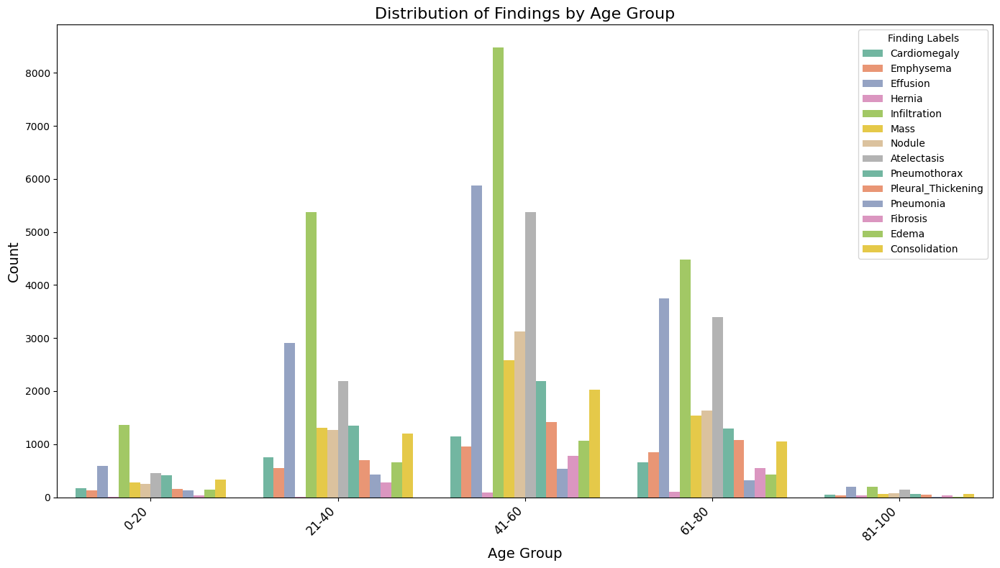

In [ ]:
age_bins = [0, 20, 40, 60, 80, 100]
age_labels = ['0-20', '21-40', '41-60', '61-80', '81-100']
data['Age Group'] = pd.cut(data['Patient Age'], bins=age_bins, labels=age_labels, right=False)
expanded_data = data.copy()
expanded_data['Finding Labels'] = expanded_data['Finding Labels'].apply(lambda x: x.split('|'))
expanded_data = expanded_data.explode('Finding Labels')
expanded_data = expanded_data[expanded_data['Finding Labels'] != 'No Finding']
plt.figure(figsize=(14, 8))
sns.countplot(x='Age Group', hue='Finding Labels', data=expanded_data, palette='Set2')
plt.title('Distribution of Findings by Age Group', fontsize=16)
plt.xlabel('Age Group', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45, fontsize=12, ha='right')
plt.tight_layout()
plt.show()


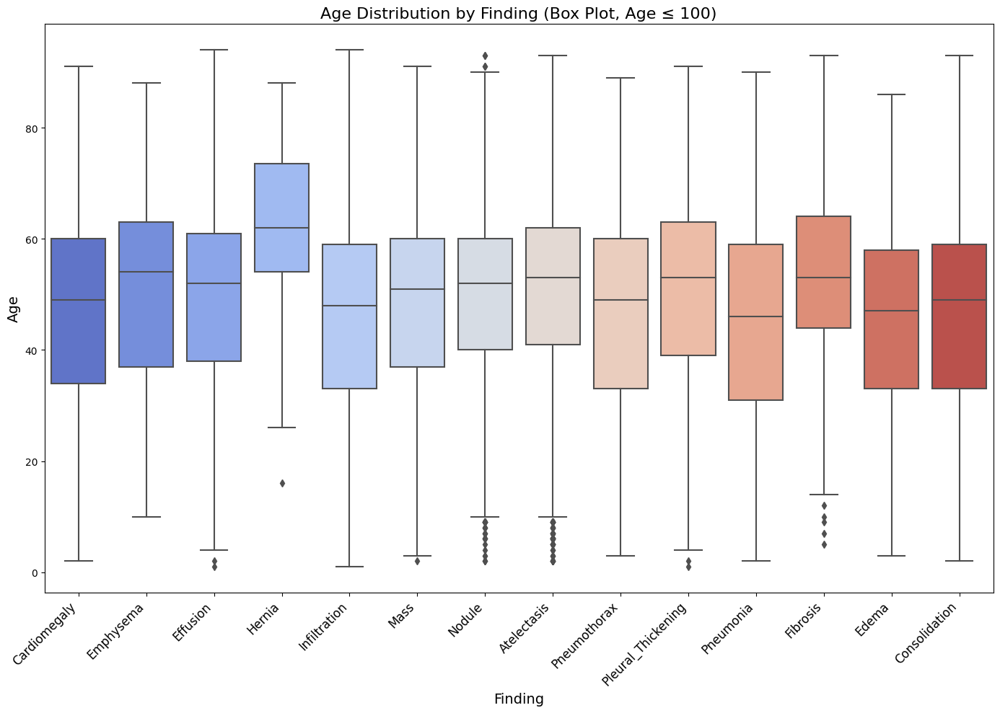

In [ ]:
expanded_data = data.copy()
expanded_data['Finding Labels'] = expanded_data['Finding Labels'].apply(split_labels)
expanded_data = expanded_data.explode('Finding Labels')
expanded_data = expanded_data[(expanded_data['Finding Labels'] != 'No Finding') & (expanded_data['Patient Age'] <= 100)]
plt.figure(figsize=(14, 10))
sns.boxplot(x='Finding Labels', y='Patient Age', data=expanded_data, palette='coolwarm')
plt.title('Age Distribution by Finding (Box Plot, Age ≤ 100)', fontsize=16)
plt.xlabel('Finding', fontsize=14)
plt.ylabel('Age', fontsize=14)
plt.xticks(rotation=45, fontsize=12, ha='right')
plt.tight_layout()
plt.show()

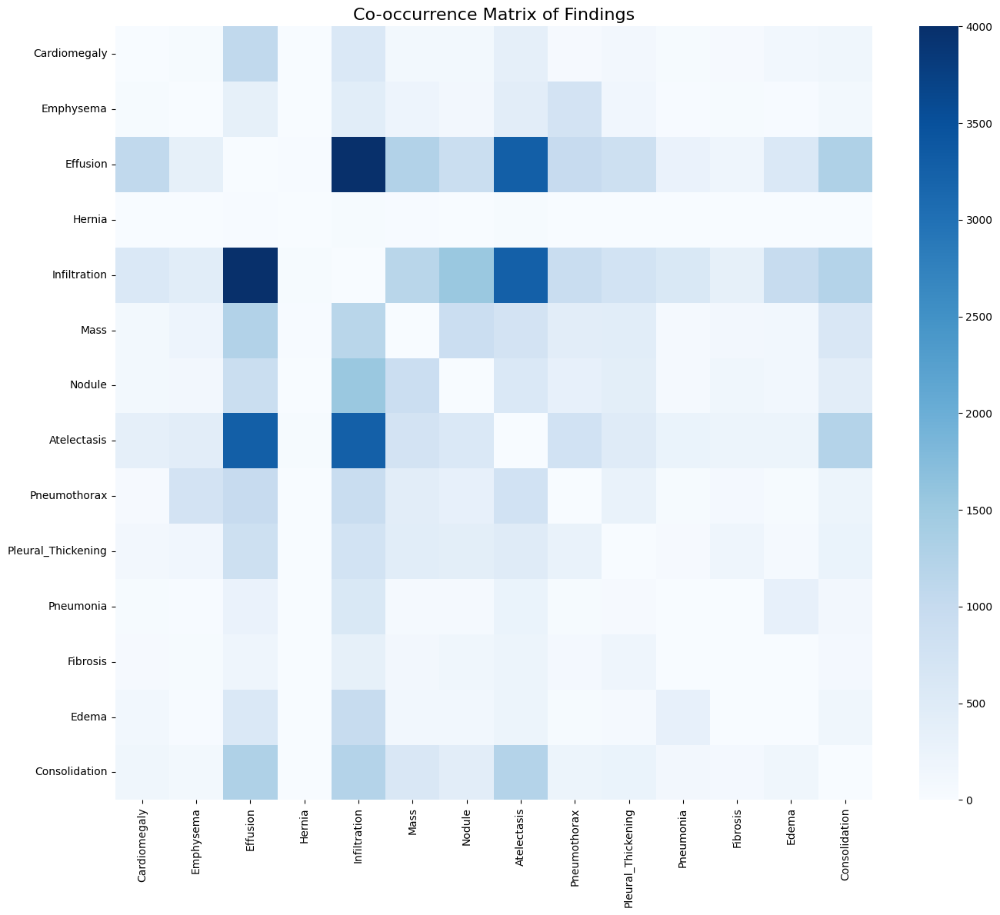

In [ ]:
co_occurrence_matrix = pd.DataFrame(0, index=finding_counts.keys(), columns=finding_counts.keys())

for findings in data['Finding Labels']:
    labels = findings.split('|')
    for combo in combinations(labels, 2):
        co_occurrence_matrix.loc[combo] += 1
        co_occurrence_matrix.loc[combo[::-1]] += 1

plt.figure(figsize=(14, 12))
sns.heatmap(co_occurrence_matrix, cmap='Blues', annot=False)
plt.title('Co-occurrence Matrix of Findings', fontsize=16)
plt.tight_layout()
plt.show()

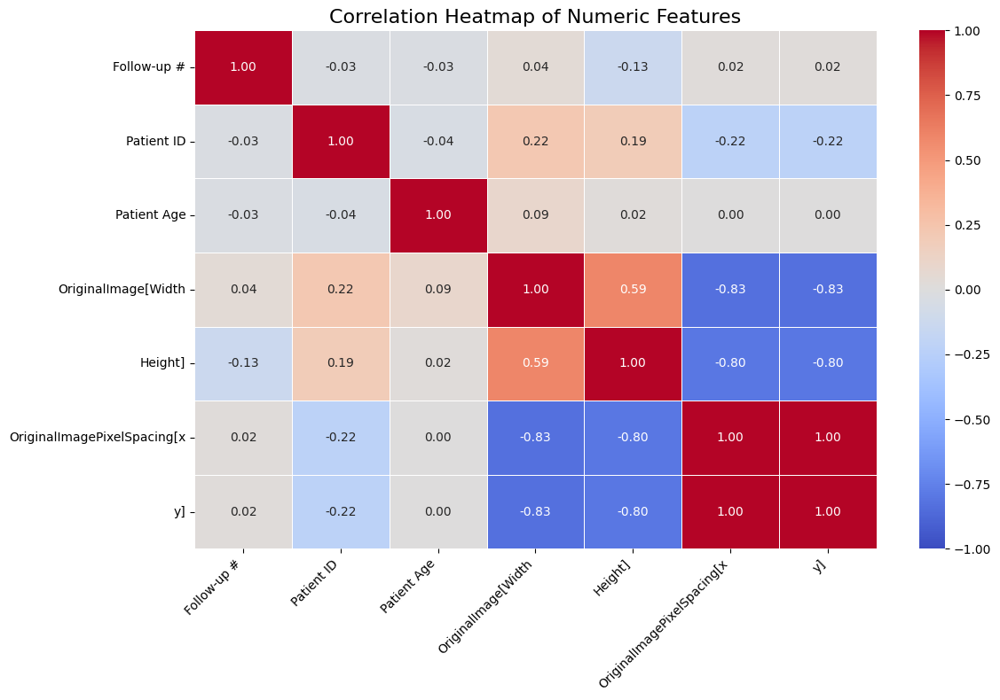

In [ ]:
data = data.loc[:, ~data.columns.str.contains('^Unnamed')]

numeric_data = data.select_dtypes(include=[np.number])
if numeric_data.shape[1] > 1:
    correlation_matrix = numeric_data.corr()
    plt.figure(figsize=(12, 8))
    sns.heatmap(
        correlation_matrix,
        annot=True,
        cmap='coolwarm',
        fmt='.2f',
        linewidths=0.5,
        center=0,
        vmin=-1,
        vmax=1
    )
    plt.title('Correlation Heatmap of Numeric Features', fontsize=16)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(fontsize=10)
    plt.tight_layout()
    plt.show()
else:
    print("Not enough numeric features to compute correlations.")


Number of Unique Findings: 836


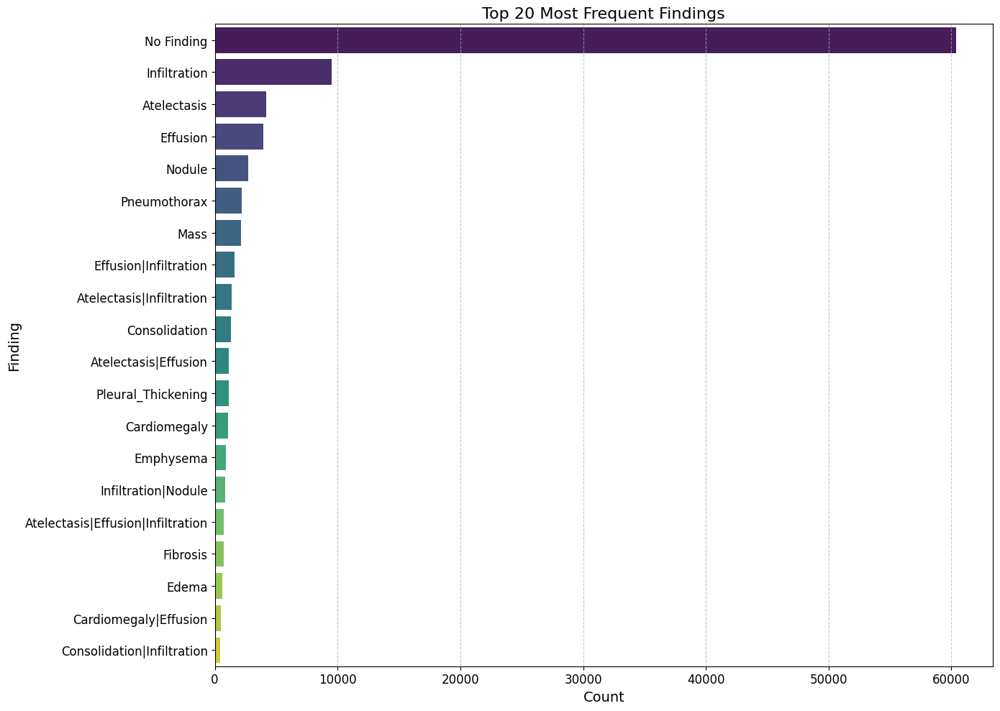

In [ ]:
data_filtered = data[data['Patient Age'] <= 100]
unique_findings = data_filtered['Finding Labels'].unique()

print(f"\nNumber of Unique Findings: {len(unique_findings)}")

finding_counts_detailed = data_filtered['Finding Labels'].value_counts()

# Plot the distribution of findings (top 20 most frequent findings)
plt.figure(figsize=(14, 10))
sns.barplot(x=finding_counts_detailed.head(20).values, y=finding_counts_detailed.head(20).index, palette='viridis')
plt.title('Top 20 Most Frequent Findings', fontsize=16)
plt.xlabel('Count', fontsize=14)
plt.ylabel('Finding', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

<ipython-input-27-b2b1fb1a58f6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered['Number of Findings'] = data_filtered['Finding Labels'].apply(lambda x: len(x.split('|')))


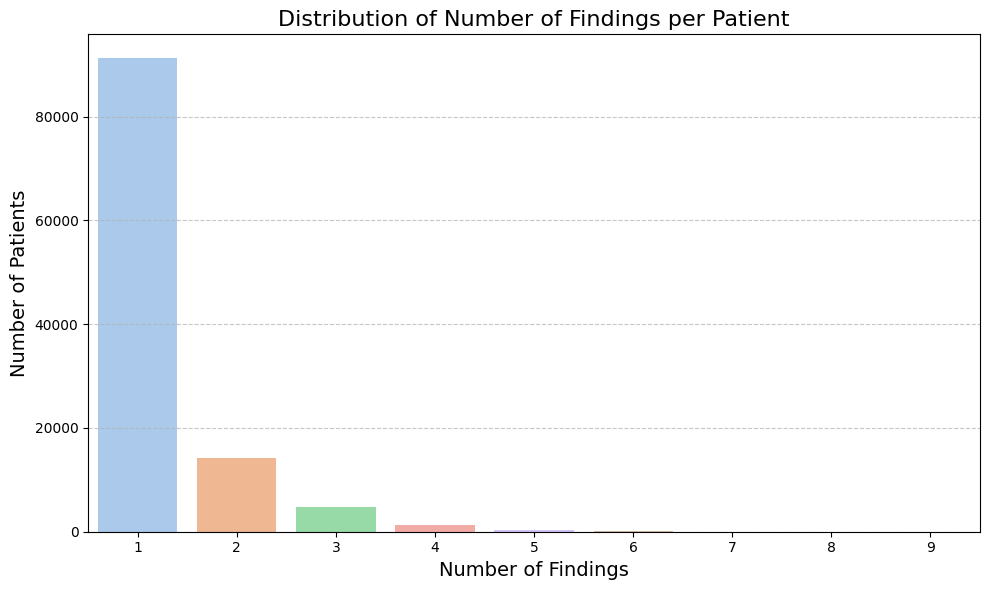

In [ ]:
data_filtered['Number of Findings'] = data_filtered['Finding Labels'].apply(lambda x: len(x.split('|')))

findings_distribution = data_filtered['Number of Findings'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
sns.barplot(x=findings_distribution.index, y=findings_distribution.values, palette='pastel')
plt.title('Distribution of Number of Findings per Patient', fontsize=16)
plt.xlabel('Number of Findings', fontsize=14)
plt.ylabel('Number of Patients', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

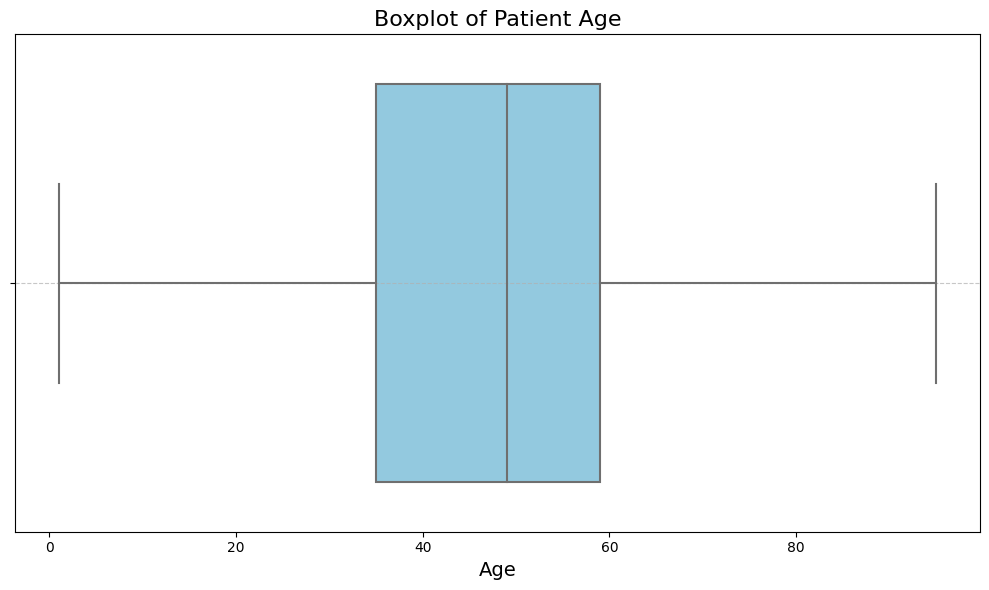

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=data_filtered['Patient Age'], color='skyblue')
plt.title('Boxplot of Patient Age', fontsize=16)
plt.xlabel('Age', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
data_entry_file = '/kaggle/input/data/Data_Entry_2017.csv'
bbox_file = '/kaggle/input/data/BBox_List_2017.csv'
train_val_file = '/kaggle/input/data/train_val_list.txt'
test_file = '/kaggle/input/data/test_list.txt'
data_entry = pd.read_csv(data_entry_file)
bbox_data = pd.read_csv(bbox_file)

# Read the train/val and test split files
with open(train_val_file, 'r') as f:
    train_val_list = [line.strip() for line in f.readlines()]
with open(test_file, 'r') as f:
    test_list = [line.strip() for line in f.readlines()]

In [ ]:
print("Total Images in Dataset:", data_entry.shape[0])
print("Total Images in Train/Validation Split:", len(train_val_list))
print("Total Images in Test Split:", len(test_list))

train_val_set = set(train_val_list)
test_set = set(test_list)

print("\nOverlap Check:")
print("Images common between Train/Val and Test:", len(train_val_set & test_set))  # Should be 0
print("Unique Images in Train/Val:", len(train_val_set))
print("Unique Images in Test:", len(test_set))

Total Images in Dataset: 112120
Total Images in Train/Validation Split: 86524
Total Images in Test Split: 25596

Overlap Check:
Images common between Train/Val and Test: 0
Unique Images in Train/Val: 86524
Unique Images in Test: 25596


In [ ]:
train_val_data = data_entry[data_entry['Image Index'].isin(train_val_list)]
test_data = data_entry[data_entry['Image Index'].isin(test_list)]

print("\nTrain/Validation Data Overview:")
print(train_val_data.head())

print("\nTest Data Overview:")
print(test_data.head())


Train/Validation Data Overview:
         Image Index          Finding Labels  Follow-up #  Patient ID  \
0   00000001_000.png            Cardiomegaly            0           1   
1   00000001_001.png  Cardiomegaly|Emphysema            1           1   
2   00000001_002.png   Cardiomegaly|Effusion            2           1   
3   00000002_000.png              No Finding            0           2   
12  00000004_000.png             Mass|Nodule            0           4   

    Patient Age Patient Gender View Position  OriginalImage[Width  Height]  \
0            58              M            PA                 2682     2749   
1            58              M            PA                 2894     2729   
2            58              M            PA                 2500     2048   
3            81              M            PA                 2500     2048   
12           82              M            AP                 2500     2048   

    OriginalImagePixelSpacing[x     y]  Unnamed: 11  
0    

In [ ]:
train_val_findings = train_val_data['Finding Labels'].value_counts()
test_findings = test_data['Finding Labels'].value_counts()

print("\nTop 5 Findings in Train/Validation Set:")
print(train_val_findings.head())

print("\nTop 5 Findings in Test Set:")
print(test_findings.head())


Top 5 Findings in Train/Validation Set:
Finding Labels
No Finding      50500
Infiltration     7327
Atelectasis      3414
Effusion         2788
Nodule           2248
Name: count, dtype: int64

Top 5 Findings in Test Set:
Finding Labels
No Finding      9861
Infiltration    2220
Effusion        1167
Pneumothorax     953
Atelectasis      801
Name: count, dtype: int64


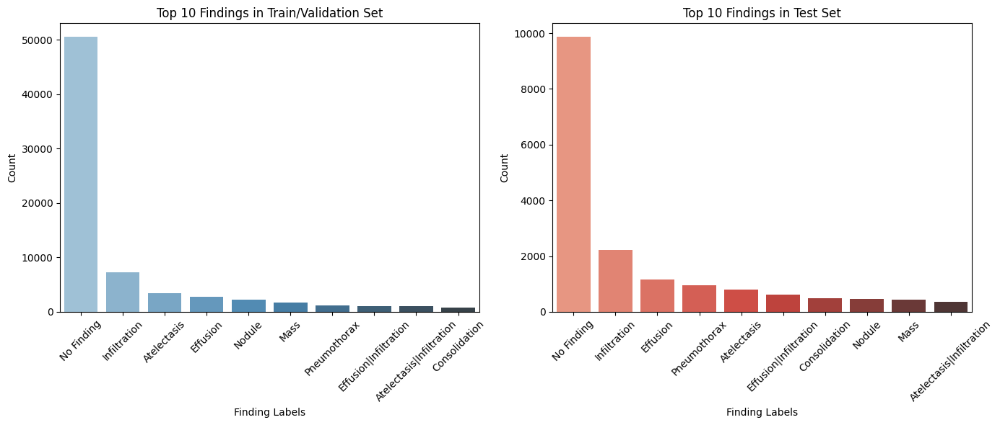

In [ ]:
plt.figure(figsize=(14, 6))

# Train/Val distribution
plt.subplot(1, 2, 1)
sns.barplot(x=train_val_findings.index[:10], y=train_val_findings.values[:10], palette='Blues_d')
plt.xticks(rotation=45)
plt.title("Top 10 Findings in Train/Validation Set")
plt.xlabel("Finding Labels")
plt.ylabel("Count")

# Test distribution
plt.subplot(1, 2, 2)
sns.barplot(x=test_findings.index[:10], y=test_findings.values[:10], palette='Reds_d')
plt.xticks(rotation=45)
plt.title("Top 10 Findings in Test Set")
plt.xlabel("Finding Labels")
plt.ylabel("Count")

plt.tight_layout()
plt.show()

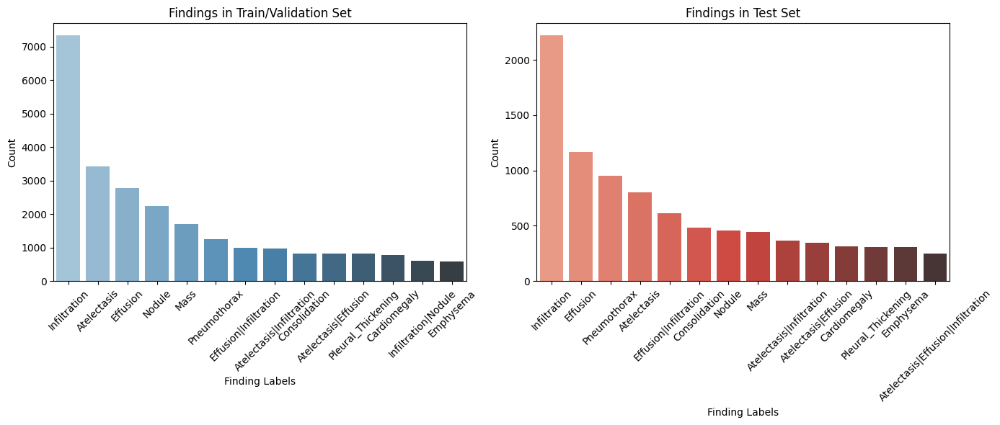

In [ ]:
plt.figure(figsize=(14, 6))

# Filter out 'No Finding' from Train/Val and Test findings
train_val_findings_no_finding = train_val_findings[train_val_findings.index != 'No Finding']
test_findings_no_finding = test_findings[test_findings.index != 'No Finding']

# Train/Val distribution
plt.subplot(1, 2, 1)
sns.barplot(
    x=train_val_findings_no_finding.index[:14],  # Show top 14
    y=train_val_findings_no_finding.values[:14],  # Show top 14
    palette='Blues_d'
)
plt.xticks(rotation=45)
plt.title("Findings in Train/Validation Set")
plt.xlabel("Finding Labels")
plt.ylabel("Count")

# Test distribution
plt.subplot(1, 2, 2)
sns.barplot(
    x=test_findings_no_finding.index[:14],  # Show top 14
    y=test_findings_no_finding.values[:14],  # Show top 14
    palette='Reds_d'
)
plt.xticks(rotation=45)
plt.title("Findings in Test Set")
plt.xlabel("Finding Labels")
plt.ylabel("Count")

plt.tight_layout()
plt.show()

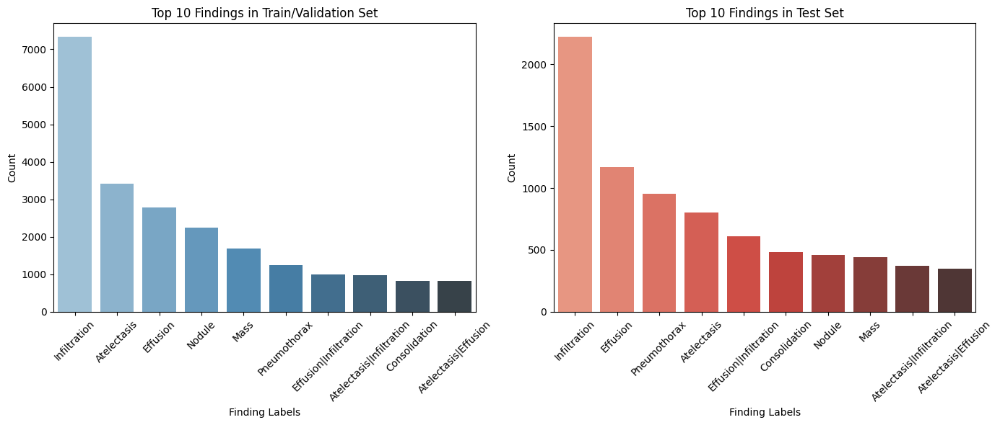

In [ ]:
plt.figure(figsize=(14, 6))

# Filter out 'No Finding' from Train/Val and Test findings
train_val_findings_no_finding = train_val_findings[train_val_findings.index != 'No Finding']
test_findings_no_finding = test_findings[test_findings.index != 'No Finding']

# Train/Val distribution
plt.subplot(1, 2, 1)
sns.barplot(
    x=train_val_findings_no_finding.index[:10],
    y=train_val_findings_no_finding.values[:10],
    palette='Blues_d'
)
plt.xticks(rotation=45)
plt.title("Top 10 Findings in Train/Validation Set")
plt.xlabel("Finding Labels")
plt.ylabel("Count")

# Test distribution
plt.subplot(1, 2, 2)
sns.barplot(
    x=test_findings_no_finding.index[:10],
    y=test_findings_no_finding.values[:10],
    palette='Reds_d'
)
plt.xticks(rotation=45)
plt.title("Top 10 Findings in Test Set")
plt.xlabel("Finding Labels")
plt.ylabel("Count")

plt.tight_layout()
plt.show()

In [ ]:
# 5. Bounding Box Data Alignment
bbox_train_val = bbox_data[bbox_data['Image Index'].isin(train_val_list)]
bbox_test = bbox_data[bbox_data['Image Index'].isin(test_list)]

print("\nBounding Box Data in Train/Validation Set:", bbox_train_val.shape[0])
print("Bounding Box Data in Test Set:", bbox_test.shape[0])

# Check missing bounding boxes
train_val_no_bbox = set(train_val_list) - set(bbox_train_val['Image Index'])
test_no_bbox = set(test_list) - set(bbox_test['Image Index'])

print("\nImages in Train/Validation without Bounding Boxes:", len(train_val_no_bbox))
print("Images in Test without Bounding Boxes:", len(test_no_bbox))


Bounding Box Data in Train/Validation Set: 0
Bounding Box Data in Test Set: 984

Images in Train/Validation without Bounding Boxes: 86524
Images in Test without Bounding Boxes: 24716


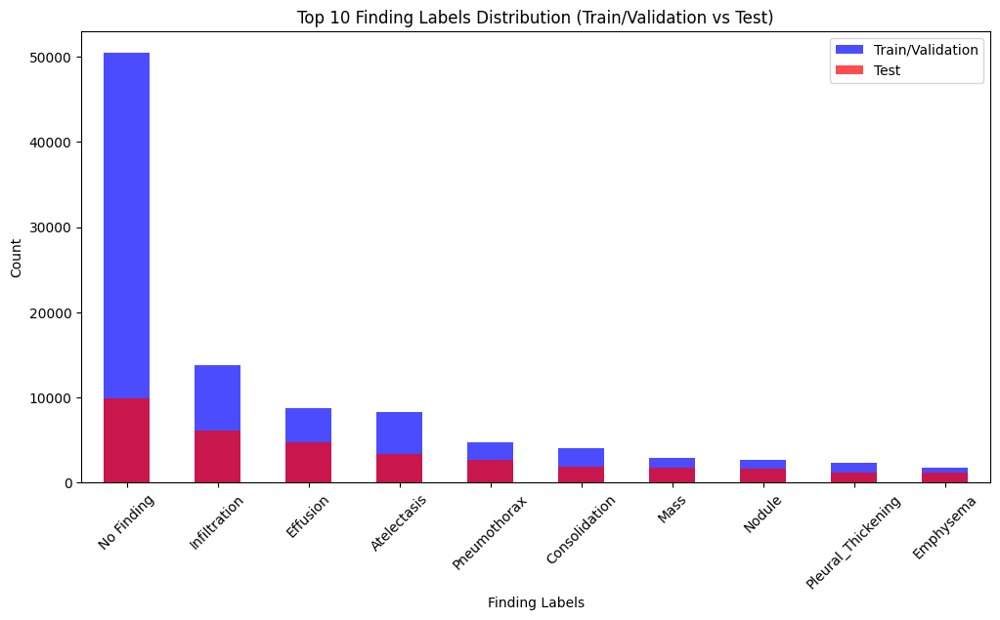

In [ ]:
train_val_label_counts = train_val_data['Finding Labels'].apply(lambda x: x.split('|')).explode().value_counts()
test_label_counts = test_data['Finding Labels'].apply(lambda x: x.split('|')).explode().value_counts()

plt.figure(figsize=(12, 6))
train_val_label_counts[:10].plot(kind='bar', color='blue', alpha=0.7, label='Train/Validation')
test_label_counts[:10].plot(kind='bar', color='red', alpha=0.7, label='Test')

plt.title("Top 10 Finding Labels Distribution (Train/Validation vs Test)")
plt.ylabel("Count")
plt.legend()
plt.xticks(rotation=45)
plt.show()

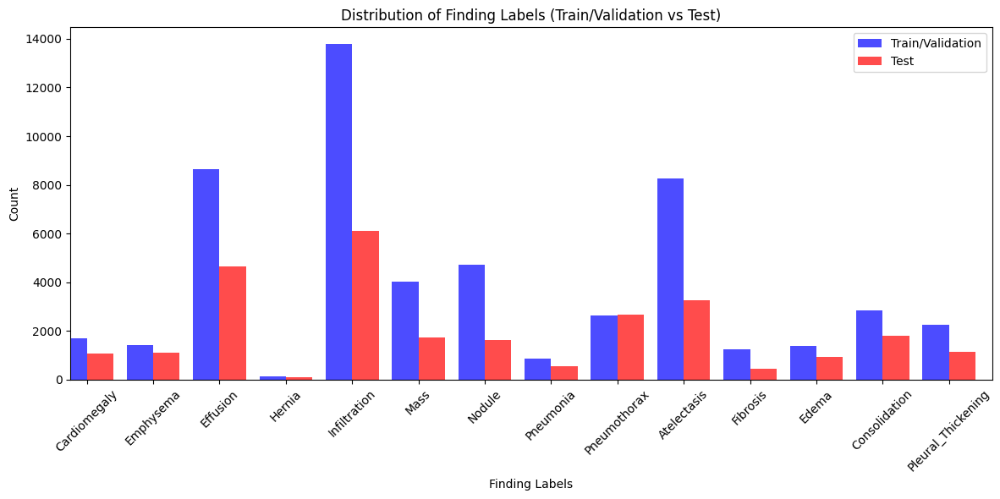

In [ ]:
# Split the labels and count occurrences for training/validation and test sets
train_val_label_counts = train_val_data['Finding Labels'].apply(lambda x: x.split('|')).explode().value_counts()
test_label_counts = test_data['Finding Labels'].apply(lambda x: x.split('|')).explode().value_counts()

# List of 14 labels you want to track
all_labels = ['Cardiomegaly', 'Emphysema', 'Effusion', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'Pneumonia',
              'Pneumothorax', 'Atelectasis', 'Fibrosis', 'Edema', 'Consolidation', 'Pleural_Thickening']

# Ensure all labels are present in the counts (adding missing labels with 0 count)
train_val_label_counts = train_val_label_counts.reindex(all_labels, fill_value=0)
test_label_counts = test_label_counts.reindex(all_labels, fill_value=0)

# Plot the comparison of the 14 labels
plt.figure(figsize=(12, 6))
train_val_label_counts.plot(kind='bar', color='blue', alpha=0.7, label='Train/Validation', width=0.4, position=1)
test_label_counts.plot(kind='bar', color='red', alpha=0.7, label='Test', width=0.4, position=0)

plt.title("Distribution of Finding Labels (Train/Validation vs Test)")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
bbox_data = pd.read_csv('/kaggle/input/data/BBox_List_2017.csv')
bbox_data = bbox_data.drop(columns=['Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8'])
bbox_data.columns = ['Image Index', 'Finding Label', 'Bbox x', 'y', 'w', 'h']

bbox_data['w'] = pd.to_numeric(bbox_data['w'], errors='coerce')
bbox_data['h'] = pd.to_numeric(bbox_data['h'], errors='coerce')
bbox_data = bbox_data.dropna(subset=['w', 'h'])
bbox_data['Aspect Ratio'] = bbox_data['w'] / bbox_data['h']
# print(bbox_data.head())

In [ ]:
bbox_desc = bbox_data[['w', 'h']].describe()
print("Descriptive Statistics of Bounding Box Sizes (Width & Height):")
print(bbox_desc)

Descriptive Statistics of Bounding Box Sizes (Width & Height):
                w           h
count  984.000000  984.000000
mean   256.334708  252.302547
std    167.629620  159.443635
min     27.306667   21.617778
25%    136.533333  115.674074
50%    214.340942  216.949153
75%    311.832381  367.902430
max    901.120000  873.379894


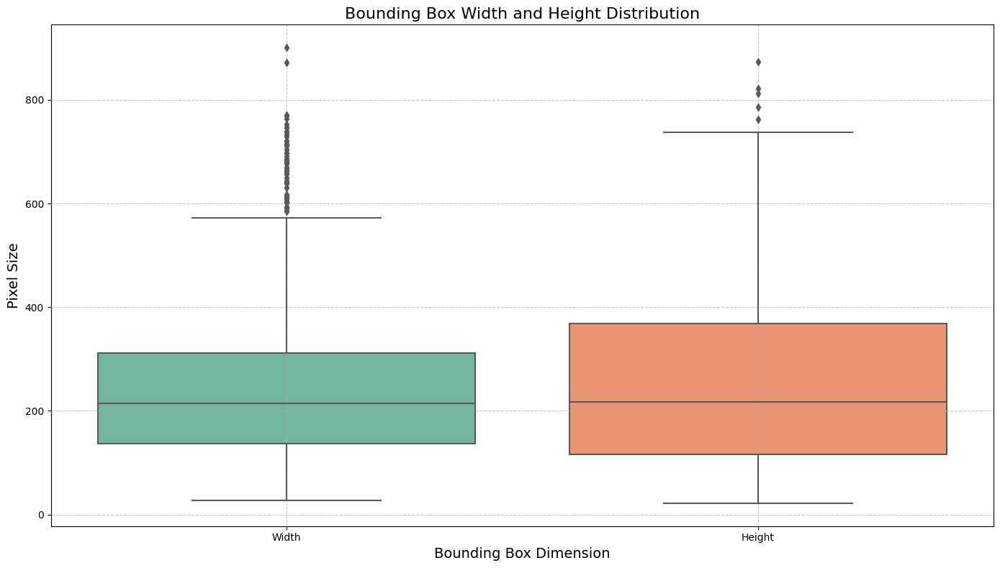

In [ ]:
plt.figure(figsize=(14, 8))
sns.boxplot(x='variable', y='value', data=pd.melt(bbox_data[['w', 'h']]), palette='Set2')
plt.title('Bounding Box Width and Height Distribution', fontsize=16)
plt.xlabel('Bounding Box Dimension', fontsize=14)
plt.ylabel('Pixel Size', fontsize=14)
plt.xticks([0, 1], ['Width', 'Height'])
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

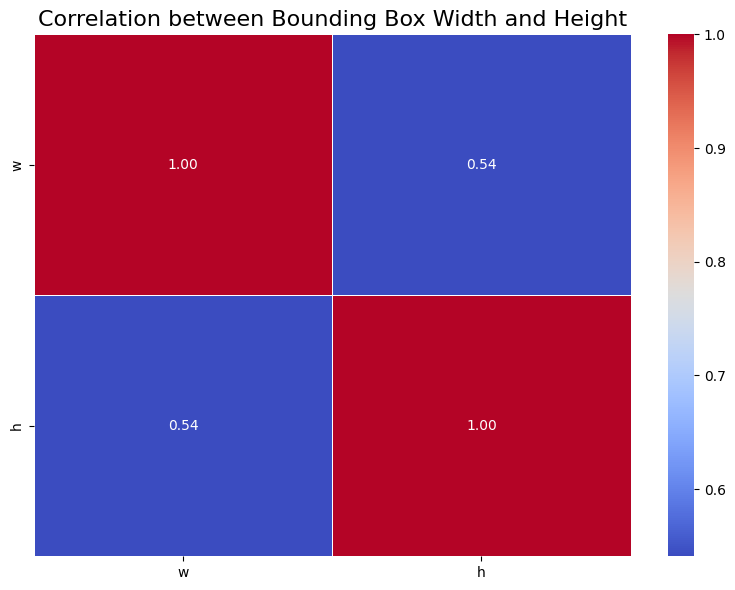

In [ ]:
plt.figure(figsize=(8, 6))
sns.heatmap(bbox_data[['w', 'h']].corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation between Bounding Box Width and Height', fontsize=16)
plt.tight_layout()
plt.show()

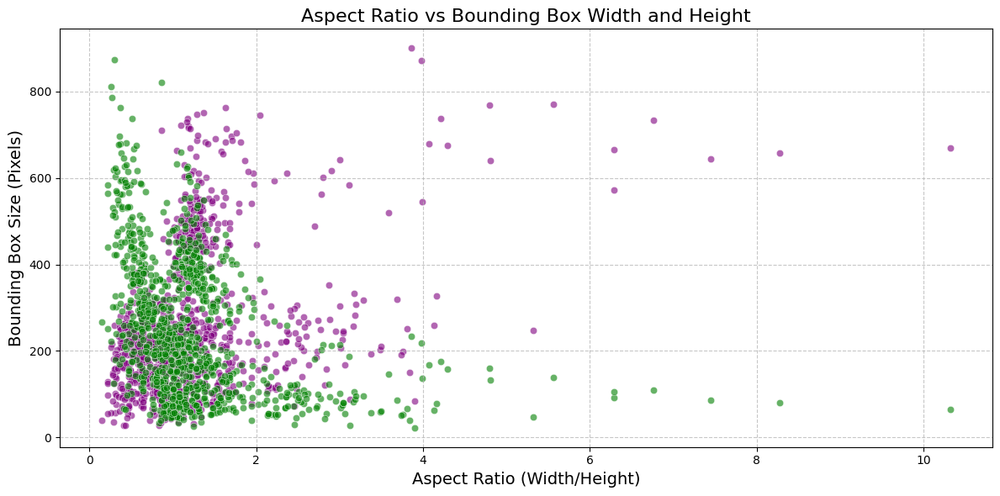

In [ ]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x=bbox_data['Aspect Ratio'], y=bbox_data['w'], color='purple', alpha=0.6)
sns.scatterplot(x=bbox_data['Aspect Ratio'], y=bbox_data['h'], color='green', alpha=0.6)
plt.title('Aspect Ratio vs Bounding Box Width and Height', fontsize=16)
plt.xlabel('Aspect Ratio (Width/Height)', fontsize=14)
plt.ylabel('Bounding Box Size (Pixels)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

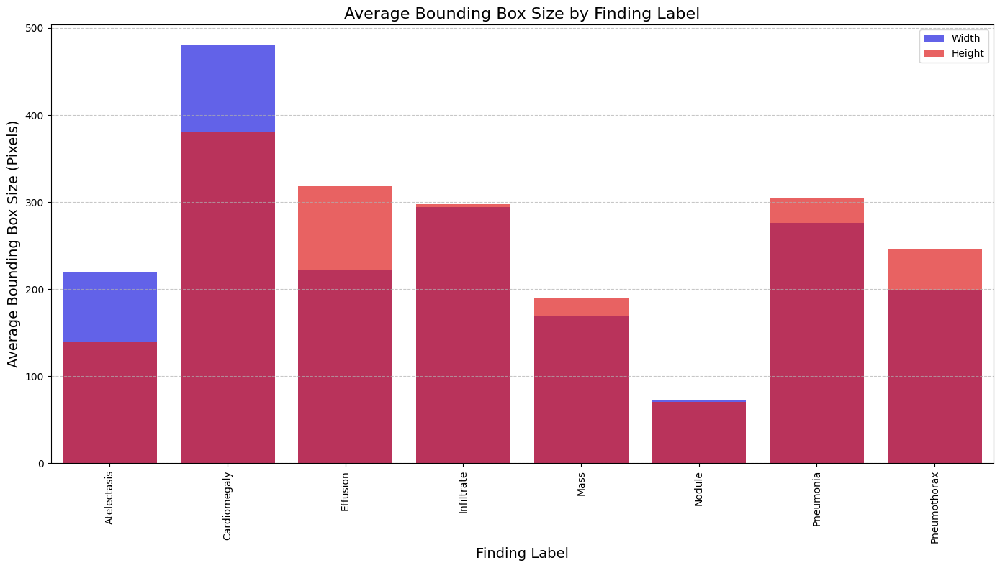

In [ ]:
finding_bboxes = bbox_data.groupby('Finding Label')[['w', 'h']].mean().reset_index()

plt.figure(figsize=(14, 8))
sns.barplot(x='Finding Label', y='w', data=finding_bboxes, color='blue', label='Width', alpha=0.7)
sns.barplot(x='Finding Label', y='h', data=finding_bboxes, color='red', label='Height', alpha=0.7)
plt.title('Average Bounding Box Size by Finding Label', fontsize=16)
plt.xlabel('Finding Label', fontsize=14)
plt.ylabel('Average Bounding Box Size (Pixels)', fontsize=14)
plt.xticks(rotation=90)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [ ]:
def detect_outliers(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return lower_bound, upper_bound

width_outliers = detect_outliers(bbox_data['w'])
height_outliers = detect_outliers(bbox_data['h'])

outliers_width = bbox_data[(bbox_data['w'] < width_outliers[0]) | (bbox_data['w'] > width_outliers[1])]
outliers_height = bbox_data[(bbox_data['h'] < height_outliers[0]) | (bbox_data['h'] > height_outliers[1])]

print(f"\nOutliers in Bounding Box Width: {outliers_width.shape[0]} instances")
print(f"Outliers in Bounding Box Height: {outliers_height.shape[0]} instances")



Outliers in Bounding Box Width: 59 instances
Outliers in Bounding Box Height: 5 instances


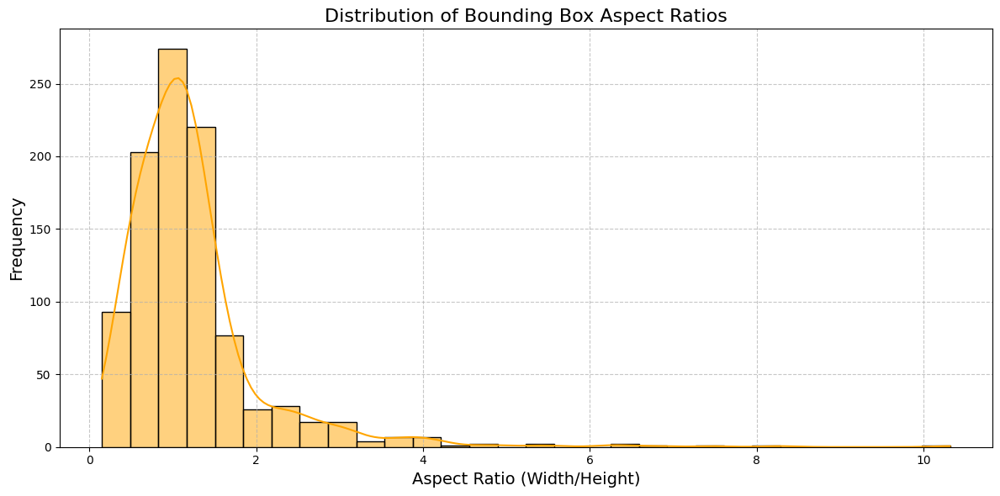

In [ ]:
plt.figure(figsize=(12, 6))
sns.histplot(bbox_data['Aspect Ratio'], kde=True, color='orange', bins=30)
plt.title('Distribution of Bounding Box Aspect Ratios', fontsize=16)
plt.xlabel('Aspect Ratio (Width/Height)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

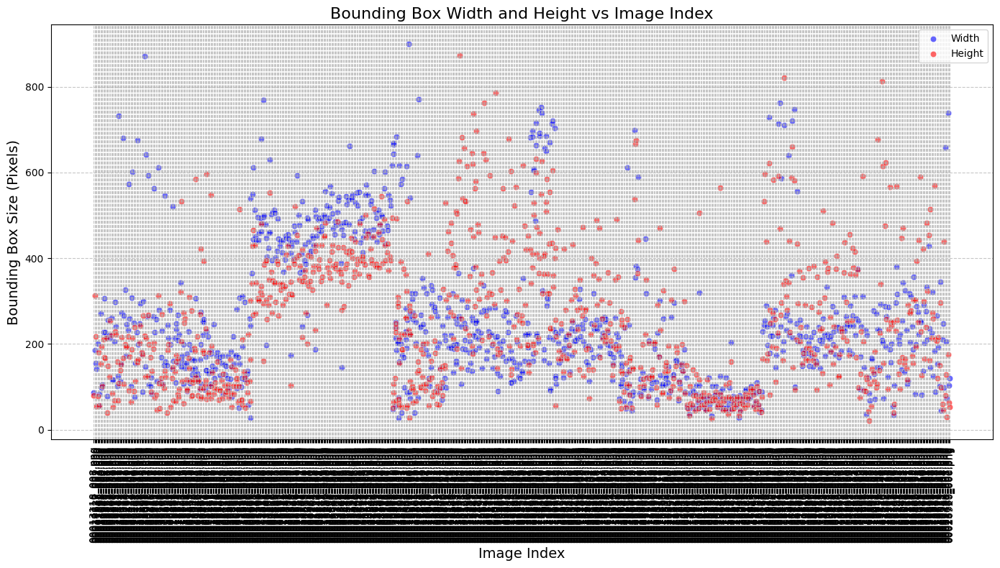

In [ ]:
plt.figure(figsize=(14, 8))
sns.scatterplot(x=bbox_data['Image Index'], y=bbox_data['w'], color='blue', alpha=0.6, label='Width')
sns.scatterplot(x=bbox_data['Image Index'], y=bbox_data['h'], color='red', alpha=0.6, label='Height')
plt.title('Bounding Box Width and Height vs Image Index', fontsize=16)
plt.xlabel('Image Index', fontsize=14)
plt.ylabel('Bounding Box Size (Pixels)', fontsize=14)
plt.legend()
plt.xticks(rotation=90)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

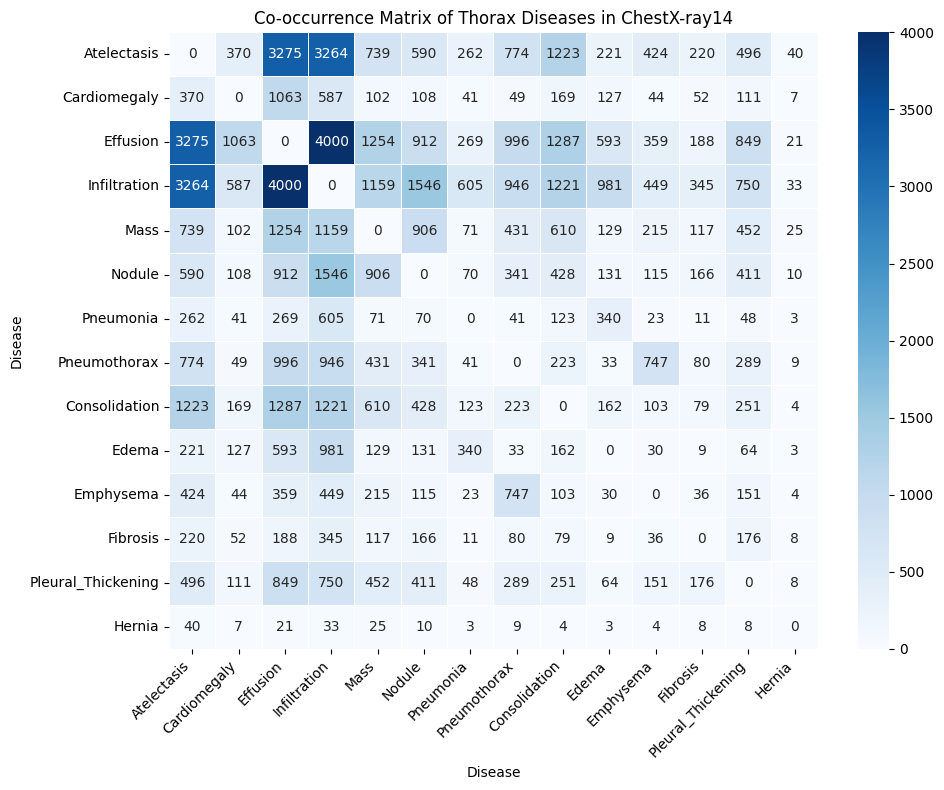

In [ ]:
diseases = [
    'Atelectasis', 'Cardiomegaly', 'Effusion', 'Infiltration', 'Mass',
    'Nodule', 'Pneumonia', 'Pneumothorax', 'Consolidation', 'Edema',
    'Emphysema', 'Fibrosis', 'Pleural_Thickening', 'Hernia'
]

co_occurrence_matrix = pd.DataFrame(0, index=diseases, columns=diseases)

for _, row in data.iterrows():
    # Extract the disease labels for the current image
    labels = row['Finding Labels'].split('|')  # Assuming labels are separated by '|'

    for label1 in labels:
        for label2 in labels:
            if label1 != label2:
                co_occurrence_matrix.at[label1, label2] += 1

plt.figure(figsize=(10, 8))
sns.heatmap(co_occurrence_matrix, annot=True, cmap="Blues", fmt='d', linewidths=0.5)
plt.title('Co-occurrence Matrix of Thorax Diseases in ChestX-ray14')
plt.xlabel('Disease')
plt.ylabel('Disease')
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


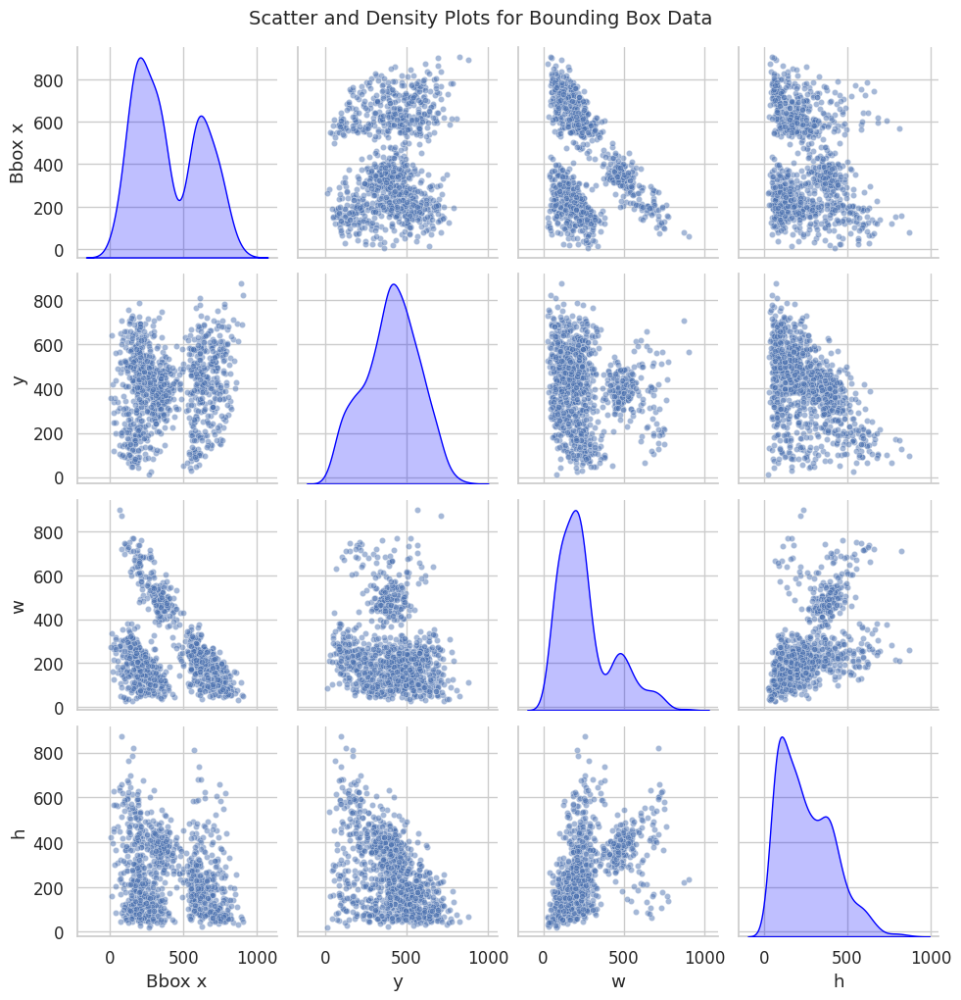

In [ ]:
bbox_data = pd.read_csv('/kaggle/input/data/BBox_List_2017.csv')
bbox_data = bbox_data.drop(columns=['Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8'])
bbox_data.columns = ['Image Index', 'Finding Label', 'Bbox x', 'y', 'w', 'h']
bbox_data['w'] = pd.to_numeric(bbox_data['w'], errors='coerce')
bbox_data['h'] = pd.to_numeric(bbox_data['h'], errors='coerce')
bbox_data = bbox_data.dropna(subset=['w', 'h'])
bbox_plot_data = bbox_data[['Bbox x', 'y', 'w', 'h']]
sns.set(style="whitegrid", font_scale=1.1)
pairplot = sns.pairplot(
    bbox_plot_data,
    diag_kind="kde",
    plot_kws={"alpha": 0.5, "s": 20},
    diag_kws={"shade": True, "color": "blue"}
)

plt.suptitle("Scatter and Density Plots for Bounding Box Data", y=1.02, fontsize=14)
plt.show()


Index(['ImageIndex', 'FindingLabels', 'Follow-up#', 'PatientID', 'PatientAge',
       'PatientGender', 'ViewPosition', 'w', 'h', 'x', 'y'],
      dtype='object')
   Follow-up#  PatientID  PatientAge     w     h      x      y
0           0          1          58  2682  2749  0.143  0.143
1           1          1          58  2894  2729  0.143  0.143
2           2          1          58  2500  2048  0.168  0.168
3           0          2          81  2500  2048  0.171  0.171
4           0          3          81  2582  2991  0.143  0.143


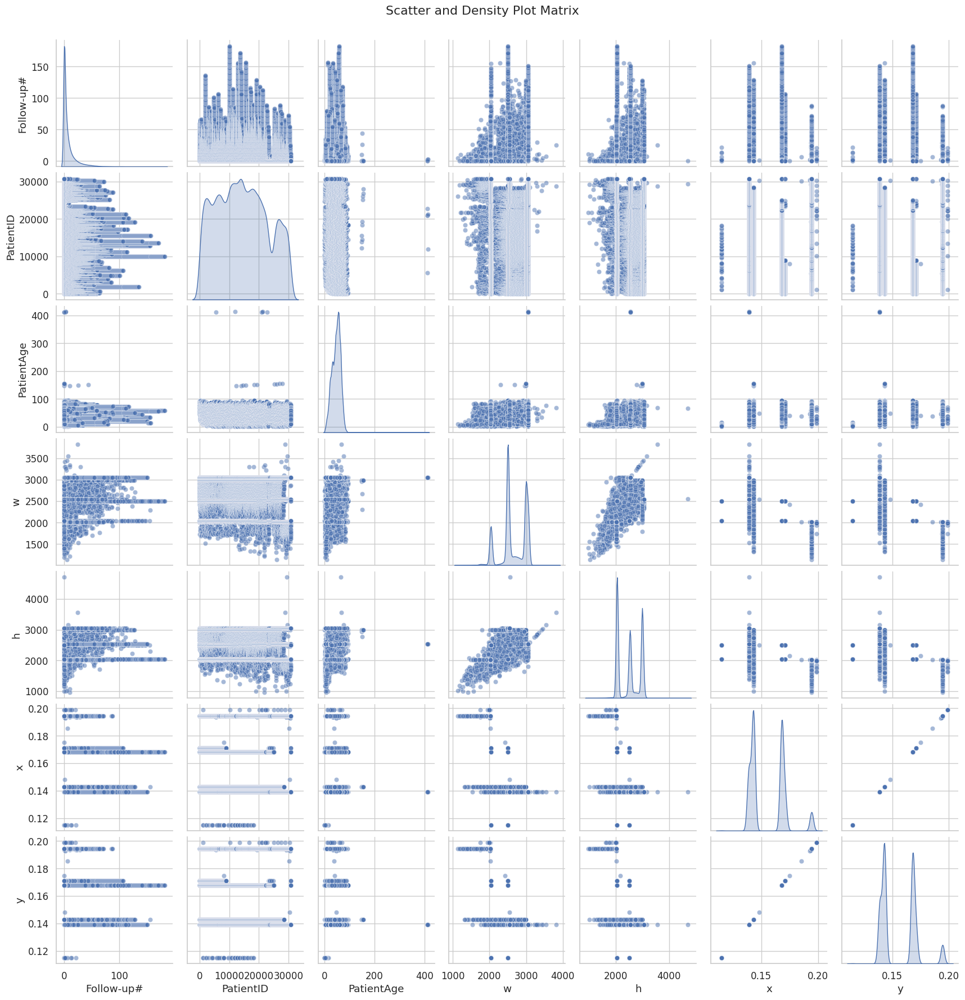

In [ ]:
# Load the data
data = pd.read_csv('/kaggle/input/data/Data_Entry_2017.csv')

# Clean column names
data.columns = data.columns.str.strip().str.replace(r'[\[\]]', '', regex=True).str.replace(' ', '')

# Drop any Unnamed columns
data = data.loc[:, ~data.columns.str.contains('Unnamed')]

# Rename selected columns to simpler names
data = data.rename(columns={
    'OriginalImagePixelSpacingx': 'x',
    'OriginalImagePixelSpacingy': 'y',
    'OriginalImageWidth': 'w',
    'Height': 'h'
})

print(data.columns)
selected_columns = ['Follow-up#', 'PatientID', 'PatientAge', 'w', 'h', 'x', 'y']
numeric_data = data[selected_columns].dropna()
print(numeric_data.head())
numeric_data = data[selected_columns].dropna()
def correlation_annotate(x, y, **kwargs):
    corr_coef = np.corrcoef(x, y)[0, 1]
    ax = plt.gca()
    ax.annotate(f"Corr. coef = {corr_coef:.2f}",
                xy=(0.1, 0.9), xycoords=ax.transAxes, fontsize=10)
g = sns.pairplot(numeric_data,
                 diag_kind="kde",
                 plot_kws={'alpha': 0.5})
for i, j in zip(*np.triu_indices_from(g.axes, 1)):
    g.axes[i, j].annotate = correlation_annotate

plt.suptitle('Scatter and Density Plot Matrix', y=1.02)
plt.show()

In [ ]:
import os
from glob import glob

from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [ ]:
def plotPerColumnDistribution(df, nGraphShown, nGraphPerRow):
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 1 and nunique[col] < 50]]
    nRow, nCol = df.shape
    columnNames = list(df)
    nGraphRow = int((nCol + nGraphPerRow - 1) / nGraphPerRow)
    plt.figure(num = None, figsize = (6 * nGraphPerRow, 8 * nGraphRow), dpi = 80, facecolor = 'w', edgecolor = 'k')
    for i in range(min(nCol, nGraphShown)):
        plt.subplot(nGraphRow, nGraphPerRow, i + 1)
        columnDf = df.iloc[:, i]
        if (not np.issubdtype(type(columnDf.iloc[0]), np.number)):
            valueCounts = columnDf.value_counts()
            valueCounts.plot.bar()
        else:
            columnDf.hist()
        plt.ylabel('counts')
        plt.xticks(rotation = 90)
        plt.title(f'{columnNames[i]} (column {i})')
    plt.tight_layout(pad = 1.0, w_pad = 1.0, h_pad = 1.0)
    plt.show()

In [ ]:
def plotCorrelationMatrix(df, graphWidth):
    filename = getattr(df, 'dataframeName', 'DataFrame')  # Safely access dataframeName attribute
    df = df.dropna(axis='columns')  # Drop columns with NaN values
    df = df.select_dtypes(include=[float, int])  # Keep only numeric columns

    # Keep columns with more than 1 unique value
    df = df[[col for col in df if df[col].nunique() > 1]]

    if df.shape[1] < 2:
        print(f'No correlation plots shown: The number of non-NaN or constant columns ({df.shape[1]}) is less than 2')
        return

    corr = df.corr()
    plt.figure(num=None, figsize=(graphWidth, graphWidth), dpi=80, facecolor='w', edgecolor='k')
    corrMat = plt.matshow(corr, fignum=1)
    plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
    plt.yticks(range(len(corr.columns)), corr.columns)
    plt.gca().xaxis.tick_bottom()
    plt.colorbar(corrMat)
    plt.title(f'Correlation Matrix for {filename}', fontsize=15)
    plt.show()

In [ ]:
def plotScatterMatrix(df, plotSize, textSize):
    df = df.select_dtypes(include =[np.number])
    df = df.dropna(axis='columns')
    df = df[[col for col in df if df[col].nunique() > 1]]
    columnNames = list(df)
    if len(columnNames) > 10:
        columnNames = columnNames[:10]
    df = df[columnNames]
    ax = pd.plotting.scatter_matrix(df, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate('Corr. coef = %.3f' % corrs[i, j], (0.8, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize)
    plt.suptitle('Scatter and Density Plot')
    plt.show()

In [ ]:
nRowsRead = 1000 # We choose to see the first 1000 rows. Specify 'None' if want to read whole file
data1 = pd.read_csv('../input/data/BBox_List_2017.csv', delimiter=',', nrows = nRowsRead)
df1 = data1.copy()
df1.dataframeName = 'BBox_List_2017.csv'
nRow, nCol = df1.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 984 rows and 9 columns


In [ ]:
df1.head()

,Image Index,Finding Label,Bbox [x,y,w,h],Unnamed: 6,Unnamed: 7,Unnamed: 8
0,00013118_008.png,Atelectasis,225.084746,547.019217,86.779661,79.186441,NaN,NaN,NaN
1,00014716_007.png,Atelectasis,686.101695,131.543498,185.491525,313.491525,NaN,NaN,NaN
2,00029817_009.png,Atelectasis,221.830508,317.053115,155.118644,216.949153,NaN,NaN,NaN
3,00014687_001.png,Atelectasis,726.237288,494.951420,141.016949,55.322034,NaN,NaN,NaN
4,00017877_001.png,Atelectasis,660.067797,569.780787,200.677966,78.101695,NaN,NaN,NaN


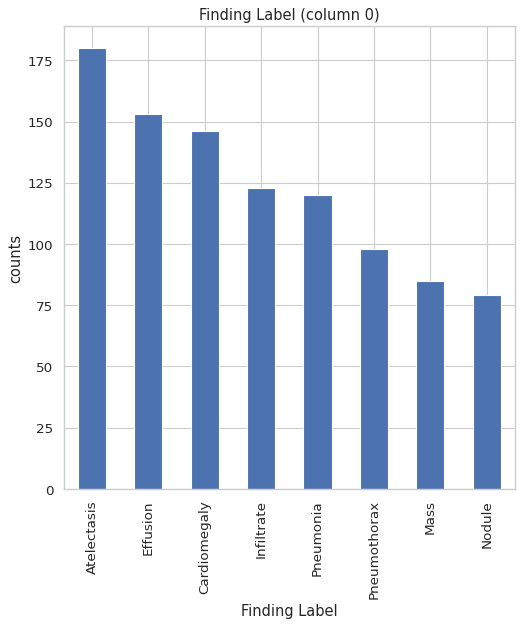

In [ ]:
plotPerColumnDistribution(df1, 10, 5)

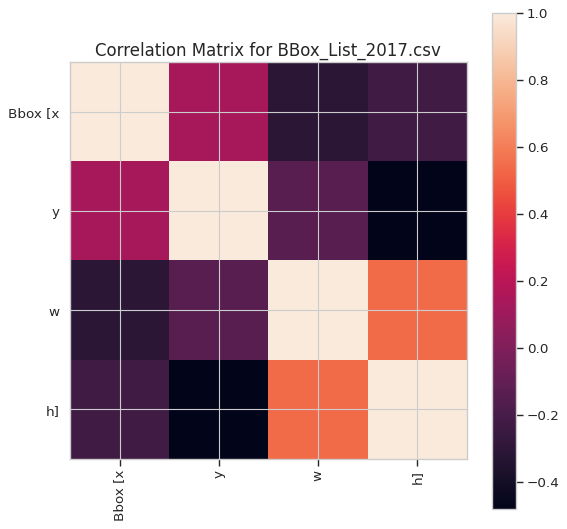

In [ ]:
plotCorrelationMatrix(df1, 8)

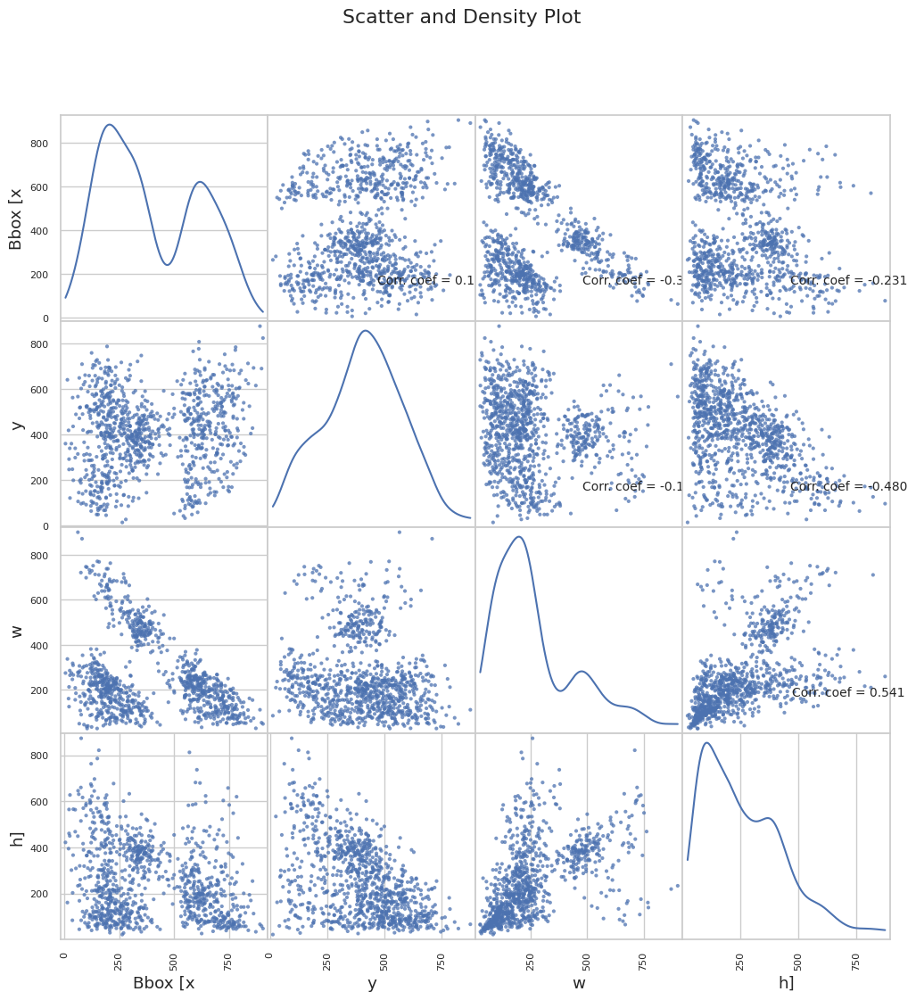

In [ ]:
plotScatterMatrix(df1, 12, 10)

In [ ]:
nRowsRead = 2000
# Data_Entry_2017.csv has 112121 rows in reality, but we are only loading/previewing the first 1000 rows
data2 = pd.read_csv('../input/data/Data_Entry_2017.csv', delimiter=',', nrows = nRowsRead)
df2 = data2.copy()
df2.dataframeName = 'Data_Entry_2017.csv'
nRow, nCol = df2.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 2000 rows and 12 columns


In [ ]:
df2.head()

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11
0,00000001_000.png,Cardiomegaly,0,1,58,M,PA,2682,2749,0.143,0.143,NaN
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,2894,2729,0.143,0.143,NaN
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,2500,2048,0.168,0.168,NaN
3,00000002_000.png,No Finding,0,2,81,M,PA,2500,2048,0.171,0.171,NaN
4,00000003_000.png,Hernia,0,3,81,F,PA,2582,2991,0.143,0.143,NaN


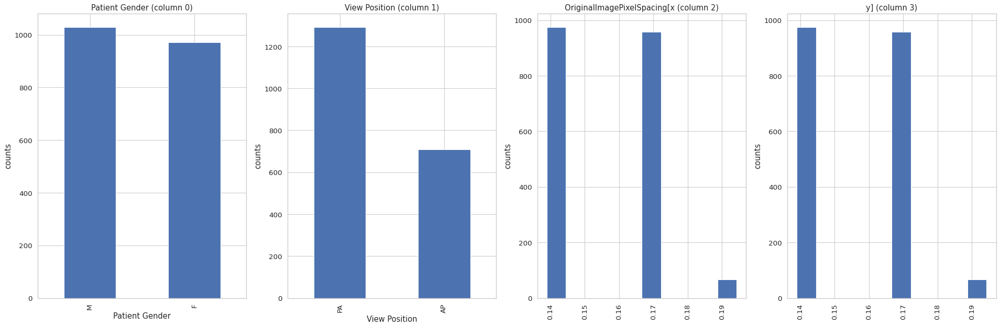

In [ ]:
plotPerColumnDistribution(df2, 10, 5)

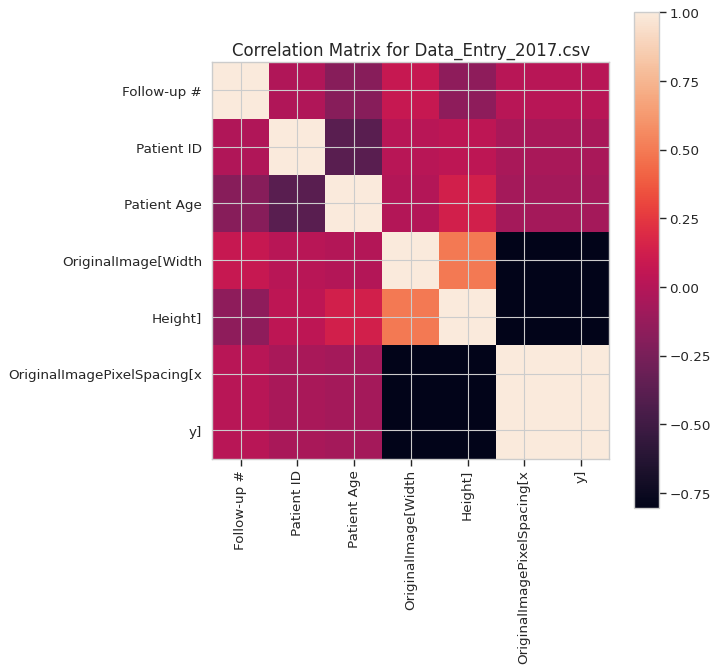

In [ ]:
plotCorrelationMatrix(df2, 8)

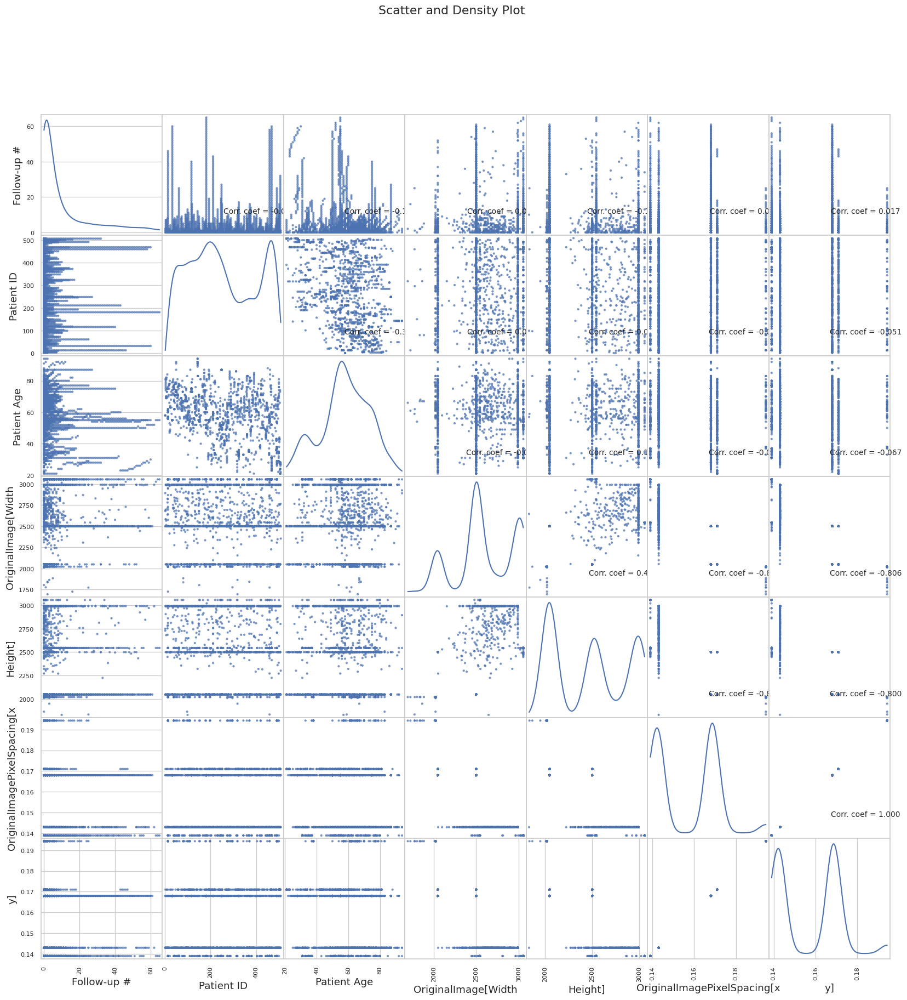

In [ ]:
plotScatterMatrix(df2, 20, 10)

In [ ]:
all_xray_df = pd.read_csv('../input/data/Data_Entry_2017.csv')
all_image_paths = {os.path.basename(x): x for x in
                   glob(os.path.join('..', 'input', 'data', 'images*', '*', '*.png'))}
print('Scans found:', len(all_image_paths), ', Total Headers', all_xray_df.shape[0])
all_xray_df['path'] = all_xray_df['Image Index'].map(all_image_paths.get)
all_xray_df['Patient Age'] = all_xray_df['Patient Age'].astype(str)
all_xray_df['Patient Age'] = all_xray_df['Patient Age'].map(lambda x: int(x[:-1]) if x[-1].isalpha() else int(x))
all_xray_df.sample(3)

Scans found: 112120 , Total Headers 112120


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11,path
57200,00014201_004.png,No Finding,4,14201,29,F,AP,2500,2048,0.168,0.168,NaN,../input/data/images_007/images/00014201_004.png
40880,00010590_011.png,Atelectasis,11,10590,70,M,PA,2766,2769,0.143,0.143,NaN,../input/data/images_005/images/00010590_011.png
61713,00015247_011.png,No Finding,11,15247,55,M,AP,2500,2048,0.168,0.168,NaN,../input/data/images_007/images/00015247_011.png


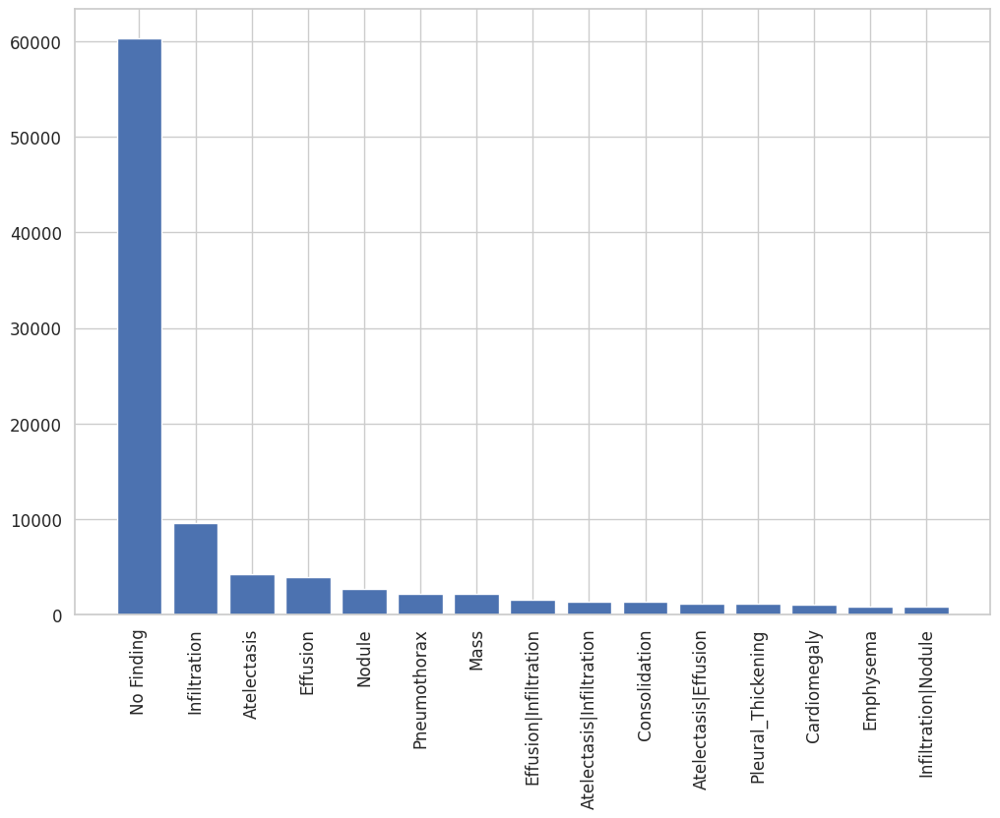

In [ ]:
label_counts = all_xray_df['Finding Labels'].value_counts()[:15]
fig, ax1 = plt.subplots(1,1,figsize = (12, 8))
ax1.bar(np.arange(len(label_counts))+0.5, label_counts)
ax1.set_xticks(np.arange(len(label_counts))+0.5)
_ = ax1.set_xticklabels(label_counts.index, rotation = 90)

In [ ]:
all_xray_df['Finding Labels'] = all_xray_df['Finding Labels'].map(lambda x: x.replace('No Finding', ''))
from itertools import chain
all_labels = np.unique(list(chain(*all_xray_df['Finding Labels'].map(lambda x: x.split('|')).tolist())))
all_labels = [x for x in all_labels if len(x)>0]
print('All Labels ({}): {}'.format(len(all_labels), all_labels))
for c_label in all_labels:
    if len(c_label)>1: # leave out empty labels
        all_xray_df[c_label] = all_xray_df['Finding Labels'].map(lambda finding: 1.0 if c_label in finding else 0)
all_xray_df.sample(3)

All Labels (14): ['Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,...,Effusion,Emphysema,Fibrosis,Hernia,Infiltration,Mass,Nodule,Pleural_Thickening,Pneumonia,Pneumothorax
17465,00004701_000.png,,0,4701,36,F,PA,2048,2500,0.171,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
24787,00006510_003.png,,3,6510,60,M,PA,2992,2991,0.143,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
82165,00020213_025.png,Pneumothorax,25,20213,72,F,AP,3056,2544,0.139,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
MIN_CASES = 2000
all_labels = [c_label for c_label in all_labels if all_xray_df[c_label].sum()>MIN_CASES]
print('Clean Labels ({})'.format(len(all_labels)),
      [(c_label,int(all_xray_df[c_label].sum())) for c_label in all_labels])

Clean Labels (11) [('Atelectasis', 11559), ('Cardiomegaly', 2776), ('Consolidation', 4667), ('Edema', 2303), ('Effusion', 13317), ('Emphysema', 2516), ('Infiltration', 19894), ('Mass', 5782), ('Nodule', 6331), ('Pleural_Thickening', 3385), ('Pneumothorax', 5302)]


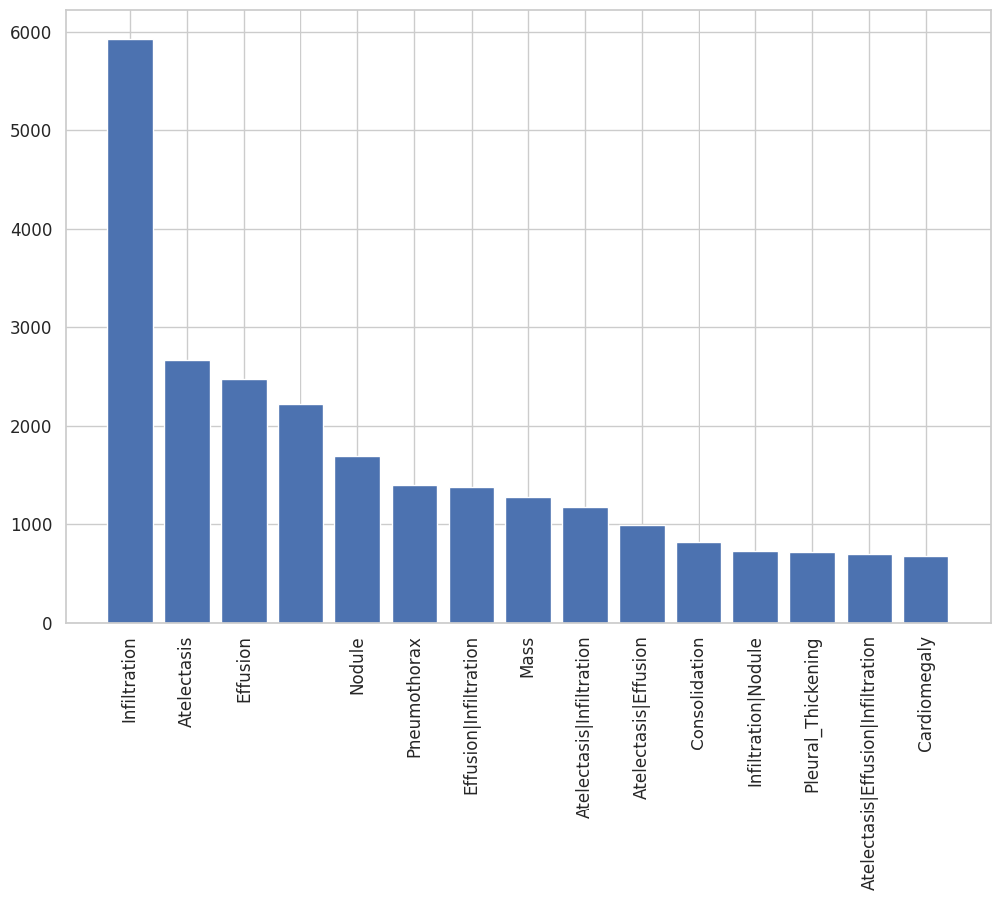

In [ ]:
sample_weights = all_xray_df['Finding Labels'].map(lambda x: len(x.split('|')) if len(x)>0 else 0).values + 4e-2
sample_weights /= sample_weights.sum()
all_xray_df = all_xray_df.sample(40000, weights=sample_weights)

label_counts = all_xray_df['Finding Labels'].value_counts()[:15]
fig, ax1 = plt.subplots(1,1,figsize = (12, 8))
ax1.bar(np.arange(len(label_counts))+0.5, label_counts)
ax1.set_xticks(np.arange(len(label_counts))+0.5)
_ = ax1.set_xticklabels(label_counts.index, rotation = 90)

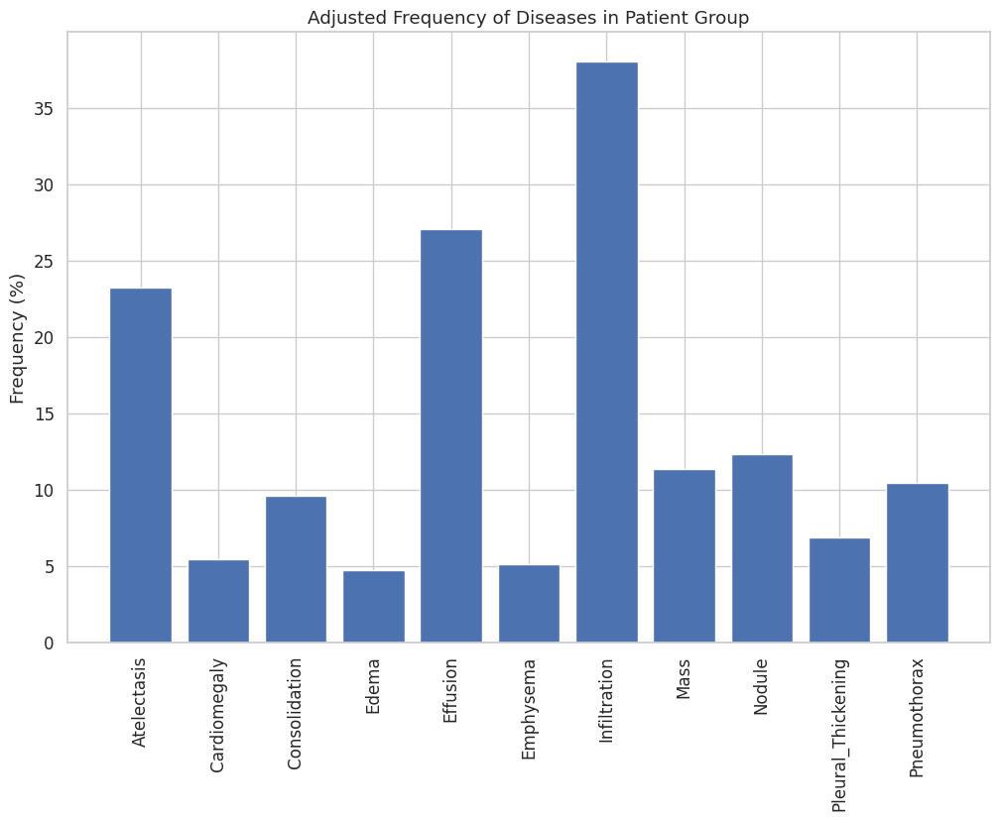

In [ ]:
label_counts = 100*np.mean(all_xray_df[all_labels].values,0)
fig, ax1 = plt.subplots(1,1,figsize = (12, 8))
ax1.bar(np.arange(len(label_counts))+0.5, label_counts)
ax1.set_xticks(np.arange(len(label_counts))+0.5)
ax1.set_xticklabels(all_labels, rotation = 90)
ax1.set_title('Adjusted Frequency of Diseases in Patient Group')
_ = ax1.set_ylabel('Frequency (%)')

In [ ]:
all_xray_df['disease_vec'] = all_xray_df.apply(lambda x: [x[all_labels].values], 1).map(lambda x: x[0])

In [ ]:
from sklearn.model_selection import train_test_split
train_df, valid_df = train_test_split(all_xray_df,
                                   test_size = 0.25,
                                   random_state = 2018,
                                   stratify = all_xray_df['Finding Labels'].map(lambda x: x[:4]))
print('train', train_df.shape[0], 'validation', valid_df.shape[0])

train 30000 validation 10000


In [ ]:
train_df['disease_vec'] = train_df['disease_vec'].apply(
    lambda x: np.array(x, dtype=np.float32) if isinstance(x, (list, np.ndarray)) else x
)
train_df = train_df[train_df['disease_vec'].apply(lambda x: isinstance(x, (list, np.ndarray)))]

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
IMG_SIZE = (128, 128)
core_idg = ImageDataGenerator(samplewise_center=True,
                              samplewise_std_normalization=True,
                              horizontal_flip = True,
                              vertical_flip = False,
                              height_shift_range= 0.05,
                              width_shift_range=0.1,
                              rotation_range=5,
                              shear_range = 0.1,
                              fill_mode = 'reflect',
                              zoom_range=0.15)

In [ ]:
train_gen = core_idg.flow_from_dataframe(
    dataframe=train_df,
    x_col='path',
    y_col='disease_vec',
    target_size=IMG_SIZE,
    color_mode='grayscale',
    class_mode='raw',  # Passes multi-label vectors
    batch_size=32
)

def float32_gen(generator):
    for batch_x, batch_y in generator:
        # Convert `batch_y` to a NumPy array with dtype float32
        batch_y = np.array([np.array(y, dtype=np.float32) for y in batch_y])
        yield batch_x, batch_y

train_gen = float32_gen(train_gen)

valid_gen = core_idg.flow_from_dataframe(
    dataframe=valid_df,
    x_col='path',
    y_col='disease_vec',
    target_size=IMG_SIZE,
    color_mode='grayscale',
    class_mode='raw',
    batch_size=256
)

test_X, test_Y = next(core_idg.flow_from_dataframe(
    dataframe=valid_df,
    x_col='path',
    y_col='disease_vec',
    target_size=IMG_SIZE,
    color_mode='grayscale',
    class_mode='raw',
    batch_size=1024,
    shuffle=False
))

test_Y = np.stack(test_Y, axis=0).astype(np.float32)

Found 30000 validated image filenames.
Found 10000 validated image filenames.
Found 10000 validated image filenames.


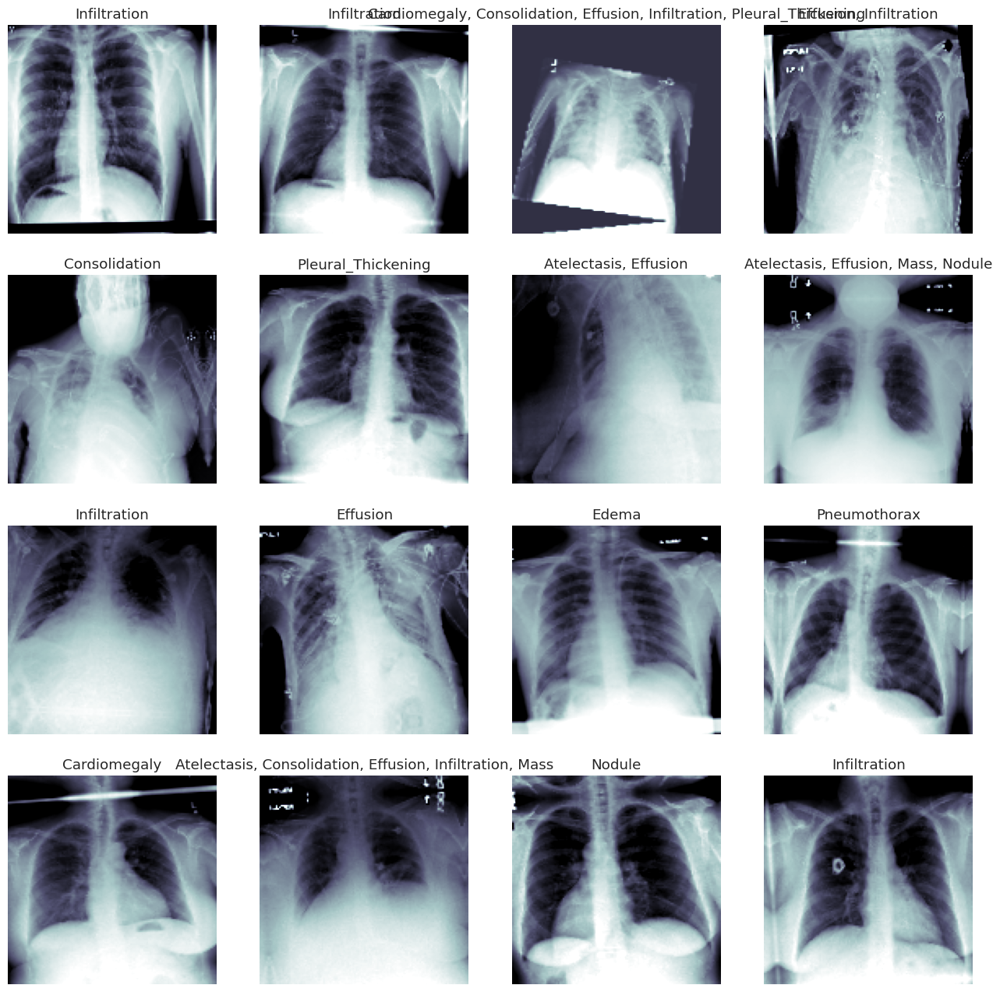

In [ ]:
t_x, t_y = next(train_gen)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,0], cmap = 'bone', vmin = -1.5, vmax = 1.5)
    c_ax.set_title(', '.join([n_class for n_class, n_score in zip(all_labels, c_y)
                             if n_score>0.5]))
    c_ax.axis('off')

In [ ]:
from keras.applications.mobilenet import MobileNet
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from keras.models import Sequential
base_mobilenet_model = MobileNet(input_shape =  t_x.shape[1:],
                                 include_top = False, weights = None)
multi_disease_model = Sequential()
multi_disease_model.add(base_mobilenet_model)
multi_disease_model.add(GlobalAveragePooling2D())
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(512))
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(len(all_labels), activation = 'sigmoid'))
multi_disease_model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
                           metrics = ['binary_accuracy', 'mae'])
#multi_disease_model.summary()

In [ ]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

weight_path = "{}_weights.best.weights.h5".format('xray_class')

checkpoint = ModelCheckpoint(
    weight_path,
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    mode='min',
    save_weights_only=True
)

early = EarlyStopping(
    monitor="val_loss",
    mode="min",
    patience=3
)

callbacks_list = [checkpoint, early]

In [ ]:
multi_disease_model.fit(
    train_gen,  # Generator for training data
    steps_per_epoch=100,
    validation_data=(test_X, test_Y),
    epochs=5,
    callbacks=callbacks_list
)

Epoch 1/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - binary_accuracy: 0.8157 - loss: 0.5403 - mae: 0.2287
Epoch 1: val_loss improved from inf to 0.41315, saving model to xray_class_weights.best.weights.h5
100/100 ━━━━━━━━━━━━━━━━━━━━ 146s 1s/step - binary_accuracy: 0.8158 - loss: 0.5399 - mae: 0.2287 - val_binary_accuracy: 0.8536 - val_loss: 0.4132 - val_mae: 0.2812
Epoch 2/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - binary_accuracy: 0.8420 - loss: 0.4416 - mae: 0.2259
Epoch 2: val_loss improved from 0.41315 to 0.40792, saving model to xray_class_weights.best.weights.h5
100/100 ━━━━━━━━━━━━━━━━━━━━ 130s 1s/step - binary_accuracy: 0.8421 - loss: 0.4414 - mae: 0.2258 - val_binary_accuracy: 0.8348 - val_loss: 0.4079 - val_mae: 0.2008
Epoch 3/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - binary_accuracy: 0.8460 - loss: 0.3999 - mae: 0.2230
Epoch 3: val_loss did not improve from 0.40792
100/100 ━━━━━━━━━━━━━━━━━━━━ 126s 1s/step - binary_accuracy: 0.8460 - loss: 0.3998 - mae: 0.2230 - val_binar

In [ ]:
for c_label, s_count in zip(all_labels, 100*np.mean(test_Y,0)):
    print('%s: %2.2f%%' % (c_label, s_count))

Atelectasis: 24.51%
Cardiomegaly: 5.27%
Consolidation: 11.13%
Edema: 4.49%
Effusion: 28.61%
Emphysema: 5.47%
Infiltration: 39.65%
Mass: 10.84%
Nodule: 11.82%
Pleural_Thickening: 8.11%
Pneumothorax: 11.13%


In [ ]:
pred_Y = multi_disease_model.predict(test_X, batch_size = 32, verbose = True)

32/32 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step


32/32 ━━━━━━━━━━━━━━━━━━━━ 7s 207ms/step


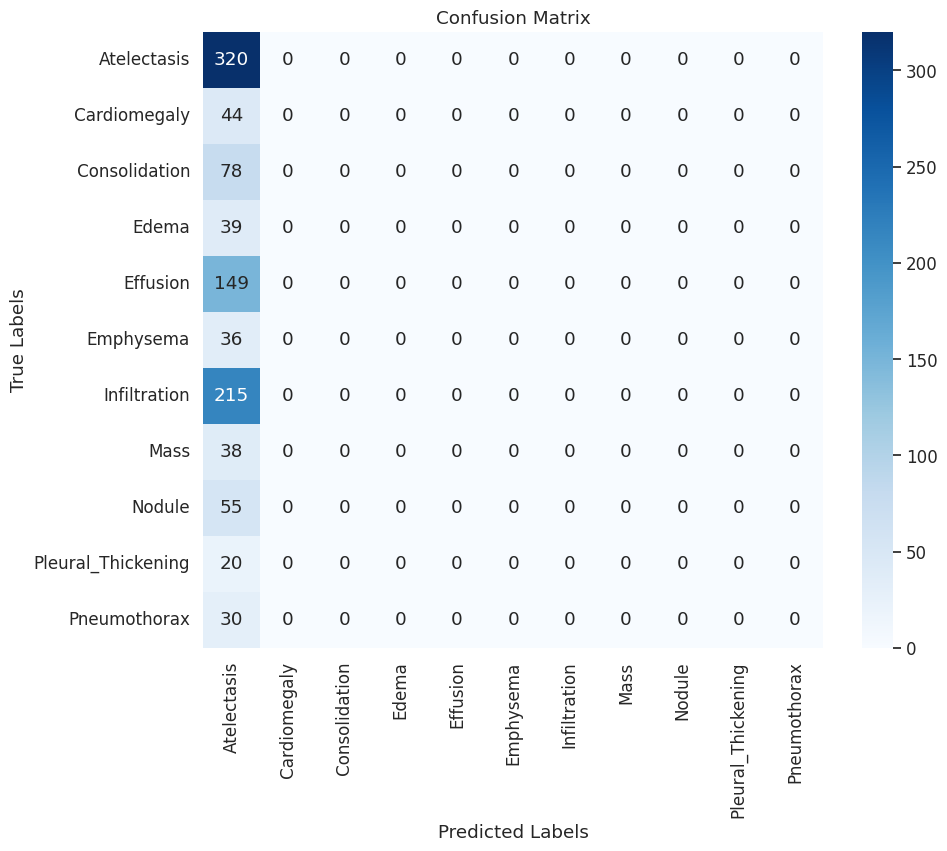

Accuracy Score: 0.31
Classification Report:

                    precision    recall  f1-score   support

       Atelectasis       0.31      1.00      0.48       320
      Cardiomegaly       0.00      0.00      0.00        44
     Consolidation       0.00      0.00      0.00        78
             Edema       0.00      0.00      0.00        39
          Effusion       0.00      0.00      0.00       149
         Emphysema       0.00      0.00      0.00        36
      Infiltration       0.00      0.00      0.00       215
              Mass       0.00      0.00      0.00        38
            Nodule       0.00      0.00      0.00        55
Pleural_Thickening       0.00      0.00      0.00        20
      Pneumothorax       0.00      0.00      0.00        30

          accuracy                           0.31      1024
         macro avg       0.03      0.09      0.04      1024
      weighted avg       0.10      0.31      0.15      1024



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
import seaborn as sns

# Generate predictions (adjust as necessary for your model and test data)
pred_Y = (multi_disease_model.predict(test_X) > 0.5).astype(int)

# Compute confusion matrix
conf_matrix = confusion_matrix(test_Y.argmax(axis=1), pred_Y.argmax(axis=1))

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=all_labels, yticklabels=all_labels)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.savefig('confusion_matrix.png')
plt.show()

# Compute accuracy score
accuracy = accuracy_score(test_Y.argmax(axis=1), pred_Y.argmax(axis=1))
print(f"Accuracy Score: {accuracy:.2f}")

# Classification report
print("Classification Report:\n")
print(classification_report(test_Y.argmax(axis=1), pred_Y.argmax(axis=1), target_names=all_labels))


In [ ]:
multi_disease_model.load_weights(weight_path)

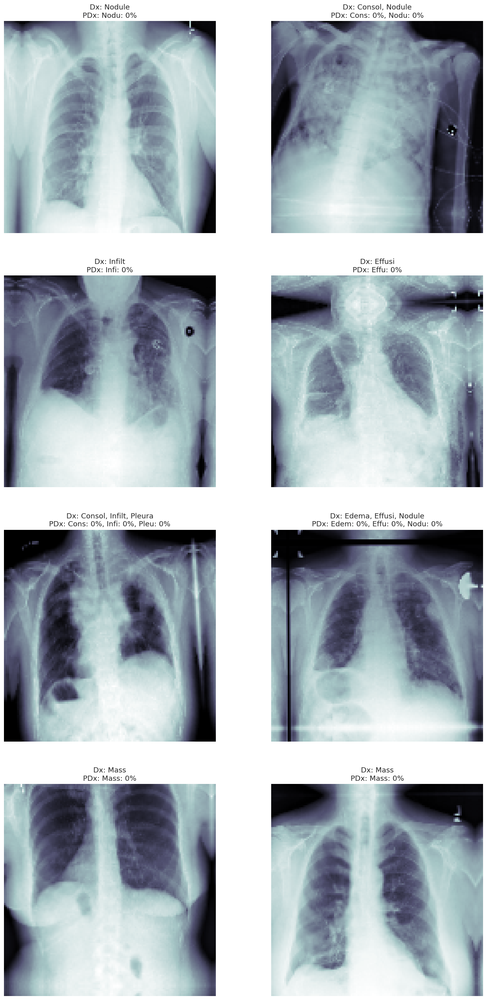

In [ ]:
sickest_idx = np.argsort(np.sum(test_Y, 1)<1)
fig, m_axs = plt.subplots(4, 2, figsize = (16, 32))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(all_labels,
                                                                  test_Y[idx])
                             if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(all_labels,
                                                                  test_Y[idx], pred_Y[idx])
                             if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('Dx: '+', '.join(stat_str)+'\nPDx: '+', '.join(pred_str))
    c_ax.axis('off')
fig.savefig('trained_img_predictions.png')

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

def predict_disease_from_image(image_path, model, labels):
    """
    Predict the disease(s) from a given image using the trained model.

    Args:
    - image_path (str): Path to the image file.
    - model (tf.keras.Model): Trained model.
    - labels (list): List of disease labels.

    Returns:
    - Predicted diseases with their probabilities.
    """
    # Load and preprocess the image
    img = load_img(image_path, target_size=IMG_SIZE, color_mode='grayscale')
    img_array = img_to_array(img) / 255.0  # Normalize pixel values to [0, 1]
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension

    # Predict using the model
    predictions = model.predict(img_array)[0]  # Output is a batch, take the first element

    # Map predictions to labels
    disease_predictions = {label: prob for label, prob in zip(labels, predictions)}
    sorted_predictions = sorted(disease_predictions.items(), key=lambda x: x[1], reverse=True)

    return sorted_predictions

# Path to your image
image_path = r"C:\Users\<YourUsername>\Desktop\your_image.jpg"

# Predict the disease
predicted_diseases = predict_disease_from_image(image_path, multi_disease_model, all_labels)

# Print predictions
print("Predicted Diseases and Probabilities:")
for disease, prob in predicted_diseases:
    print(f"{disease}: {prob:.2f}")

# Display the image with predictions
img = load_img(image_path, target_size=IMG_SIZE, color_mode='grayscale')
plt.imshow(img, cmap='bone')
plt.title("Predicted Diseases: " + ", ".join([f"{d}:{p:.2f}" for d, p in predicted_diseases if p > 0.5]))
plt.axis('off')
plt.show()
